# BDT

This Jupyter Notebook contains the BDT used for separating the muon neutrino and muon anti-neutrino in the mixed sample containing $\nu_{\mu} + \bar{\nu}_{\mu}$. 

Input taking the .hdr5 files containing the Pandas dataframes for the selected sample.

### Input, importing the selected sample stored into .hdr5 file

In [1]:
#====================#
#  Import Packages   #
#====================#

import math 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import gridspec
import matplotlib.patches as mpatches
import mpltern

import uproot3 as uproot

# BDT
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve, auc, recall_score, precision_score, average_precision_score, precision_recall_curve
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.utils.class_weight import compute_sample_weight
import joblib
import xgboost as xgb
import shap
from matplotlib.pylab import rcParams
import plotly.express as px
import seaborn as sns
from iminuit import Minuit


#%run numuNumubarSelection_run3b.ipynb 

In [2]:
#=====================================================================#
#  Import dataframes containing sample of mostly mixed numu anti-numu #
#=====================================================================#
lock1 = False
if lock1 == True:
    df_mc = pd.read_hdf('dfs/df_run3b_mc_mixed_numu_numubar.hdf5')
    df_beam_on = pd.read_hdf('dfs/df_run3b_data_mixed_numu_numubar.hdf5')
    df_dirt = pd.read_hdf('dfs/df_run3b_dirt_mixed_numu_numubar.hdf5')
    df_ext = pd.read_hdf('dfs/df_run3b_ext_mixed_numu_numubar.hdf5')

In [3]:
lock2 = True
if lock2 == True:
    df_mc = pd.read_hdf('dfs/df_run3b_mc_FC_mixed_numu_numubar.hdf5')
    df_beam_on = pd.read_hdf('dfs/df_run3b_data_FC_mixed_numu_numubar.hdf5')
    df_dirt = pd.read_hdf('dfs/df_run3b_dirt_FC_mixed_numu_numubar.hdf5')
    df_ext = pd.read_hdf('dfs/df_run3b_ext_FC_mixed_numu_numubar.hdf5')

In [4]:
lock3 = False
if lock3 == True:
    df_mc = pd.read_hdf('dfs/df_run3b_mc_PC_mixed_numu_numubar.hdf5')
    df_beam_on = pd.read_hdf('dfs/df_run3b_data_PC_mixed_numu_numubar.hdf5')
    df_dirt = pd.read_hdf('dfs/df_run3b_dirt_PC_mixed_numu_numubar.hdf5')
    df_ext = pd.read_hdf('dfs/df_run3b_ext_PC_mixed_numu_numubar.hdf5')

In [5]:
#==================================#
# Auxiliary functions used for BDT #
#==================================#


def label_signal(df_):
    # this function labels the sample, =1 for signal (numuCC events), and =0 for background (otherwise) # flip definition
      
    condition_numubar = (df_['truth_nuPdg']==-14)
    condition_numu = (df_['truth_nuPdg']==14)
    condition_cc = (df_['truth_isCC']==1)

    condition_not_numubar = (df_['truth_nuPdg']!=-14)
    condition_not_numu = (df_['truth_nuPdg']!=14)
    condition_not_cc = (df_['truth_isCC']!=1)

    condition_not_allNumu_reco = (df_['numu_cc_flag']<1)
    
    query_numubarcc = condition_numubar & condition_cc
    query_numucc = condition_numu & condition_cc
    query_others = (condition_not_numubar | condition_not_numu) & condition_not_cc

    df_numucc_init = df_[(query_numucc)]
    df_numubarcc_init = df_[(query_numubarcc)]
    df_others_init = df_.drop(df_numucc_init.index, errors='ignore').drop(df_numubarcc_init.index, errors='ignore')
    totalEvents = len(df_numucc_init) + len(df_numubarcc_init) + len(df_others_init)
    
    df_["bdt_numubarcc_label"] = df_.apply(lambda row:1 if query_numubarcc[row.name] else 0, axis=1)
    df_["bdt_numucc_label"] = df_.apply(lambda row:1 if query_numucc[row.name] else 0, axis=1)
    df_["bdt_others_label"] = df_.apply(lambda row:1 if query_others[row.name] else 0, axis=1)

    # for multivariate adaboost, need 1 labeling
    # df_["bdt_multi_label"] = df_.apply(lambda row:2 if query_numubarcc[row.name] else (1 if query_numucc[row.name] else 0) , axis=1)

    df_["bdt_multi_label"] = 0
    df_.loc[query_numucc, "bdt_multi_label"] = 1
    df_.loc[query_numubarcc, "bdt_multi_label"] = 2

    #Calculate the percentage of 1's
    percentage_signal_numu = (len(df_numucc_init) / totalEvents) * 100
    print(f"Labelled dataset. Portion of signal numuCC events in this sample: {percentage_signal_numu:.2f}%")
    
    percentage_signal_numubar = (len(df_numubarcc_init) / totalEvents) * 100
    print(f"Labelled dataset. Portion of signal numubarCC events in this sample: {percentage_signal_numubar:.2f}%")

    percentage_others = (len(df_others_init) / totalEvents) * 100
    print(f"Labelled dataset. Portion of background events in this sample: {percentage_others:.2f}%")
    
def remove_background_events(df_):
    # remove any event that is not nueCC/nuebarCC
    query = "(truth_nuPdg==14 | truth_nuPdg==-14) & truth_isCC==1"
    num_events_before = len(df_)
    df_.query(query, inplace=True) # keep only events where query=True
    contaminant_contribution = (num_events_before - len(df_))/num_events_before
    print(f"Removed {num_events_before - len(df_)} contaminants from the selection sample. This"
          f" constitutes {contaminant_contribution:.2%} of the sample.")

## BDT Training for MC (Development sample)

In [6]:
# Rename dataframe, allowing df_bdt to be other things in the future
df_bdt = df_mc

# Label the sample provided, include "bdt_numubarcc_label" and "bdt_numucc_label"
label_signal(df_bdt)

# Remove remaining background (everything different than numuCC/numubarCC)
# remove_background_events(df_bdt)

# Calculate extra variables
#calc_vertex_dist(df_bdt)
#calc_costheta(df_bdt)

# ============================

chosen_var = 'bdt_multi_label' # numucc=signal, everything else

# ============================

# List of variables used for training

# Original without any Michel variables
# training_variables = ['Num_Proton', 'Num_Neutron', 'Num_Gamma', 'Num_Muon', 'Num_Electron','cos_theta', 'numu_1_score', 'numu_cc_3_track_length', 'numu_cc_3_max_length_all', 
#                       'cosmict_2_dQ_dx_front', 'cosmict_2_dQ_dx_end', 'cosmict_2_angle_beam', 'cosmict_2_phi', 
#                       'numu_cc_3_max_length', 'numu_cc_3_max_muon_length']

# with reconstructed 'has_reco_michel' var
training_variables = ['Num_Proton', 'Num_Neutron', 'Num_Gamma', 'Num_Muon', 'Num_Electron','cos_theta', 'numu_1_score', 'numu_cc_3_track_length', 'numu_cc_3_max_length_all', 
                      'cosmict_2_dQ_dx_front', 'cosmict_2_dQ_dx_end', 'cosmict_2_angle_beam', 'cosmict_2_phi', 
                      'numu_cc_3_max_length', 'numu_cc_3_max_muon_length','has_reco_michel']

# # with truth 'has_truth_michel' var
# training_variables = ['Num_Proton', 'Num_Neutron', 'Num_Gamma', 'Num_Muon', 'Num_Electron','cos_theta', 'numu_1_score', 'numu_cc_3_track_length', 'numu_cc_3_max_length_all', 
#                       'cosmict_2_dQ_dx_front', 'cosmict_2_dQ_dx_end', 'cosmict_2_angle_beam', 'cosmict_2_phi', 
#                       'numu_cc_3_max_length', 'numu_cc_3_max_muon_length','has_truth_michel']

# with WC LEM vars
# training_variables = ['Num_Proton', 'Num_Neutron', 'Num_Gamma', 'Num_Muon', 'Num_Electron', 'kine_reco_Enu', 
#                       'muon_energy','cos_theta', 'numu_1_score', 'numu_cc_3_track_length', 'numu_cc_3_max_length_all', 
#                       'cosmict_2_dQ_dx_front', 'cosmict_2_dQ_dx_end', 'cosmict_2_angle_beam', 'cosmict_2_phi', 
#                       'numu_cc_3_max_length', 'numu_cc_3_max_muon_length','lem_shower_main_length', 'lem_n_3seg', 
#                       'lem_e_charge', 'lem_e_dQdx', 'lem_shower_num_main_segs']

# # with reconstructed 'has_reco_michel' and WC LEM vars
# training_variables = ['Num_Proton', 'Num_Neutron', 'Num_Gamma', 'Num_Muon', 'Num_Electron', 'kine_reco_Enu', 
#                       'muon_energy','cos_theta', 'numu_1_score', 'numu_cc_3_track_length', 'numu_cc_3_max_length_all', 
#                       'cosmict_2_dQ_dx_front', 'cosmict_2_dQ_dx_end', 'cosmict_2_angle_beam', 'cosmict_2_phi', 
#                       'numu_cc_3_max_length', 'numu_cc_3_max_muon_length', 'has_reco_michel', 'lem_shower_main_length', 'lem_n_3seg', 
#                       'lem_e_charge', 'lem_e_dQdx', 'lem_shower_num_main_segs']

# Full truth vars'Truth_Num_Muon'
#training_variables = ['Truth_Num_Proton', 'Truth_Num_Gamma', 'truth_cos_theta', 'has_truth_michel', "Truth_Proton_Tsum", "Truth_Proton_Tmax", "Truth_Num_Neutron" ,'Truth_Num_Pion']

# Split the dataset into training and validation sets - using random_state as handle on the randomness of data
features = df_bdt[training_variables]
targets = df_bdt[chosen_var]

# Compute sample weights to balance the class distribution
sample_weights = compute_sample_weight(class_weight="balanced", y=targets)
features_train, features_test, targets_train, targets_test, sample_weights_train, sample_weights_test = train_test_split(features, targets, sample_weights, test_size=0.2, random_state=0)

features_test_sig = features_test[targets_test==2]
features_test_numu = features_test[targets_test==1]
features_test_others = features_test[targets_test==0]

#Calculate the scale by which to increase the gradient for minority class examples
#scale = minority_gradient_scaler(df_bdt.copy())
#scale = 1
#print('Scaling minority class events by factor = %.2e' % scale)


Labelled dataset. Portion of signal numuCC events in this sample: 66.12%
Labelled dataset. Portion of signal numubarCC events in this sample: 11.83%
Labelled dataset. Portion of background events in this sample: 22.05%


### Use GridSearchCV to check for the best hyper-parameters

In [7]:
lock4 = False
if lock4==True:
    xgb_dic={
        'n_estimators':[50,75,100,200,300,500],
        'max_depth': [3,4,5,6,7,10],
        'eta': [0.01,0.05,0.1,0.5]
        }

    # Deine BDT object
    xgb_classifier = xgb.XGBClassifier()

    grid = GridSearchCV(xgb_classifier, xgb_dic, n_jobs=5)
    grid.fit(features_train, targets_train)

    print(f"The best score is \t{grid.best_score_}")
    print(f"The best parameters are \t{grid.best_params_}")

    results = pd.DataFrame.from_dict(grid.cv_results_)

### Training the model

In [8]:
# Create an XGBoost classifier (we should play with these parameters)
clf = xgb.XGBClassifier(n_estimators=200, # reco 300, 200 for ALL truth
                        eta=0.1, # truth/reco all 0.1
                        max_depth=3, # reco 5, all truth 3
                        #scale_pos_weight=1, 
                        #eval_metric=["error","auc", "logloss"],
                        eval_metric=["mlogloss", "merror"],
                        objective='multi:softprob',
                        num_class=3,
                        use_label_encoder=False # removes warning
                       )

# Train the classifier on our newly constructed dataset
eval_set = [(features_train, targets_train), (features_test, targets_test)]
clf.fit(features_train, targets_train, sample_weight=sample_weights_train, eval_set=eval_set)

[0]	validation_0-mlogloss:1.07496	validation_0-merror:0.50967	validation_1-mlogloss:1.07489	validation_1-merror:0.50707
[1]	validation_0-mlogloss:1.05476	validation_0-merror:0.51029	validation_1-mlogloss:1.05460	validation_1-merror:0.50822
[2]	validation_0-mlogloss:1.03738	validation_0-merror:0.50896	validation_1-mlogloss:1.03704	validation_1-merror:0.50635
[3]	validation_0-mlogloss:1.02267	validation_0-merror:0.50805	validation_1-mlogloss:1.02224	validation_1-merror:0.50743
[4]	validation_0-mlogloss:1.00962	validation_0-merror:0.50054	validation_1-mlogloss:1.00898	validation_1-merror:0.49607
[5]	validation_0-mlogloss:0.99837	validation_0-merror:0.46587	validation_1-mlogloss:0.99761	validation_1-merror:0.46277
[6]	validation_0-mlogloss:0.98796	validation_0-merror:0.44565	validation_1-mlogloss:0.98714	validation_1-merror:0.44192
[7]	validation_0-mlogloss:0.97897	validation_0-merror:0.45431	validation_1-mlogloss:0.97805	validation_1-merror:0.45153
[8]	validation_0-mlogloss:0.97061	valida

/opt/anaconda3/envs/numu_xsec/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [16:07:08] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1737531366101/work/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[28]	validation_0-mlogloss:0.88613	validation_0-merror:0.43033	validation_1-mlogloss:0.88434	validation_1-merror:0.43110
[29]	validation_0-mlogloss:0.88452	validation_0-merror:0.42907	validation_1-mlogloss:0.88274	validation_1-merror:0.43092
[30]	validation_0-mlogloss:0.88239	validation_0-merror:0.42790	validation_1-mlogloss:0.88064	validation_1-merror:0.42989
[31]	validation_0-mlogloss:0.88033	validation_0-merror:0.42756	validation_1-mlogloss:0.87854	validation_1-merror:0.43007
[32]	validation_0-mlogloss:0.87874	validation_0-merror:0.42646	validation_1-mlogloss:0.87708	validation_1-merror:0.42862
[33]	validation_0-mlogloss:0.87746	validation_0-merror:0.42643	validation_1-mlogloss:0.87584	validation_1-merror:0.42729
[34]	validation_0-mlogloss:0.87575	validation_0-merror:0.42598	validation_1-mlogloss:0.87404	validation_1-merror:0.42645
[35]	validation_0-mlogloss:0.87412	validation_0-merror:0.42489	validation_1-mlogloss:0.87254	validation_1-merror:0.42572
[36]	validation_0-mlogloss:0.872

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.1,
              eval_metric=['mlogloss', 'merror'], feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None, num_class=3, ...)

### Printing out the decision tree

In [9]:
lock2 = False
if lock2==True: 
    rcParams['figure.figsize'] = (100,100)
    xgb.plot_tree(clf)
    plt.show()

### Printing out relevant evaluation metric

In [10]:
# Get the relevant information for printing

results = clf.evals_result()
epochs = len(results['validation_0']['merror'])
x_axis = np.linspace(0, epochs, 200, endpoint=True)

In [11]:
# plt.plot(x_axis, results['validation_0']['auc'], label='Train')
# plt.plot(x_axis, results['validation_1']['auc'], label='Test')
# plt.legend()
# plt.ylabel('AUC')
# plt.xlabel('Epochs')
# plt.title('XGBoost AUC')
# plt.show()

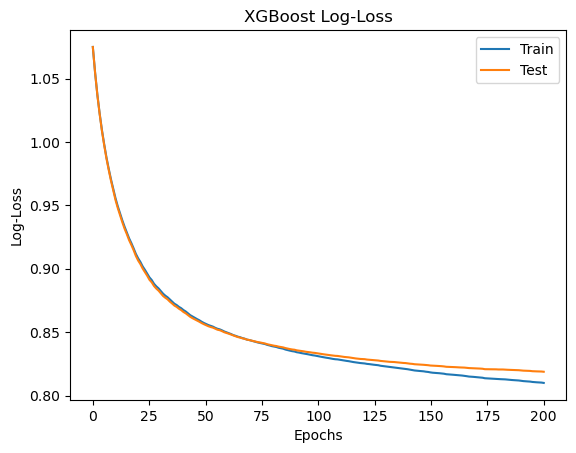

In [12]:
plt.plot(x_axis, results['validation_0']['mlogloss'], label='Train')
plt.plot(x_axis, results['validation_1']['mlogloss'], label='Test')
plt.legend()
plt.ylabel('Log-Loss')
plt.xlabel('Epochs')
plt.title('XGBoost Log-Loss')
plt.show()

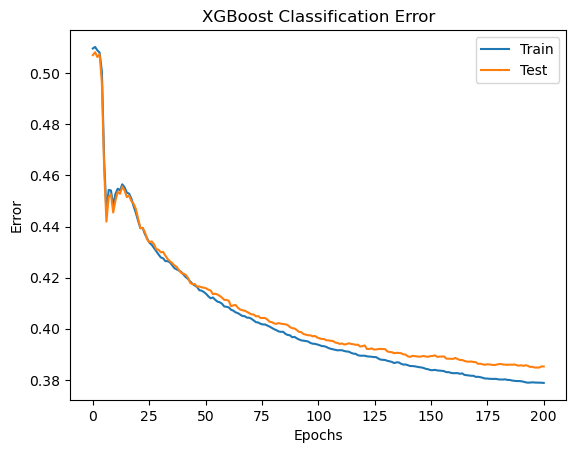

In [13]:
plt.plot(x_axis, results['validation_0']['merror'], label='Train')
plt.plot(x_axis, results['validation_1']['merror'], label='Test')
plt.legend()
plt.ylabel('Error')
plt.xlabel('Epochs')
plt.title('XGBoost Classification Error')
plt.show()

Apply the model and then predict the BDT_scores for each of the classifications

In [14]:
# Predict class labels
y_pred = clf.predict(features_test)

# Predict class probabilities
y_proba = clf.predict_proba(features_test)

# BDT score for signal (numubarCC = class 2)
bdt_score_numubarcc = y_proba[:, 2]  # probability for class=2
bdt_score_numucc = y_proba[:, 1]  # probability for class=1
bdt_score_others = y_proba[:, 0]  # probability for class=0

# Optional: print a quick check of predicted classes
unique, counts = np.unique(y_pred, return_counts=True)
print("Predicted class distribution:", dict(zip(unique, counts)))

Predicted class distribution: {0: 5400, 1: 7072, 2: 4074}


Plot the Confusion matrix

Test Accuracy: 0.6148


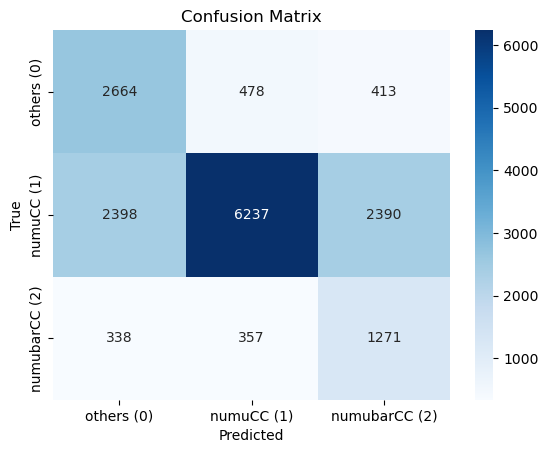

In [15]:
# Accuracy
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(targets_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")

# Confusion matrix
cm = confusion_matrix(targets_test, y_pred)

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['others (0)', 'numuCC (1)', 'numubarCC (2)'],
            yticklabels=['others (0)', 'numuCC (1)', 'numubarCC (2)'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


Extracting and Plotting ROC curve

In [16]:
# from sklearn import metrics
# def buildROC(target_test, test_preds, target_train, train_preds):
#     fpr_test, tpr_test, _ = metrics.roc_curve(target_test, test_preds)
#     fpr_train, tpr_train, _ = metrics.roc_curve(target_train, train_preds)
#     roc_auc_test = metrics.auc(fpr_test, tpr_test)
#     roc_auc_train = metrics.auc(fpr_train, tpr_train)
#     plt.title('Receiver Operating Characteristic')
#     plt.plot(fpr_test, tpr_test, label = 'Test - AUC = %0.2f' % roc_auc_test, color='g')
#     plt.plot(fpr_train, tpr_train, label = 'Train - AUC = %0.2f' % roc_auc_train, color='b')
#     plt.legend(loc = 'lower right')
#     plt.plot([0, 1], [0, 1],'r--')
#     plt.ylabel('True Positive Rate')
#     plt.xlabel('False Positive Rate')

In [17]:
# y_pred_proba_train = clf.predict_proba(features_train)
# y_pred_proba_test = clf.predict_proba(features_test)

In [18]:
# buildROC(targets_test, y_pred_proba_test[:, 1], targets_train, y_pred_proba_train[:, 1])

Feature Importance

In [19]:
def plot_important_features(features, feature_importances_, number):
    
    plt.close()
    plt.figure(figsize=(8,5))
    
    zipped = zip(features, feature_importances_)
    zipped_sort = sorted(zipped, key = lambda x:x[1], reverse=True)
    zipped_sort_reduced = zipped_sort[:number]
    
    res = [[ i for i, j in zipped_sort_reduced], 
           [ j for i, j in zipped_sort_reduced]]
    red_features = res[0]
    red_importances = res[1]
    
    plt.barh(range(len(red_importances)), red_importances, align='center')
    plt.yticks(np.arange(len(red_features)), red_features)
    plt.xlabel("Feature importance")
    plt.ylabel("Top %i features"%(number))
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.1)
    plt.tight_layout()
    plt.show()
    
    return red_features

In [20]:
# from xgboost import plot_importance

# # Get the booster from your trained XGBClassifier
# booster = clf.get_booster()

# # Get the feature names (if you trained with DataFrame, else pass manually)
# feature_names = clf.get_booster().feature_names

# # Count how many trees per class
# n_classes = clf.n_classes_
# n_trees = len(booster.get_dump())  # total number of trees
# trees_per_class = n_trees // n_classes

# for class_id in range(n_classes):
#     # Plot only the trees corresponding to this class
#     ax = plot_importance(
#         booster,
#         importance_type='gain',   # or 'weight', 'cover', etc.
#         fmap='',  # no need unless using custom mapping
#         title=f"Feature Importance - Class {class_id}",
#         max_num_features=15,
#         height=0.5,
#         ax=None,
#         grid=False
#     )
#     ax.set_title(f"Feature Importance - Class {class_id}")
#     ax.set_xlim(right=ax.get_xlim()[1]*1.4)  # widen for visibility
#     ax.set_ylabel("Features")
#     plt.show()


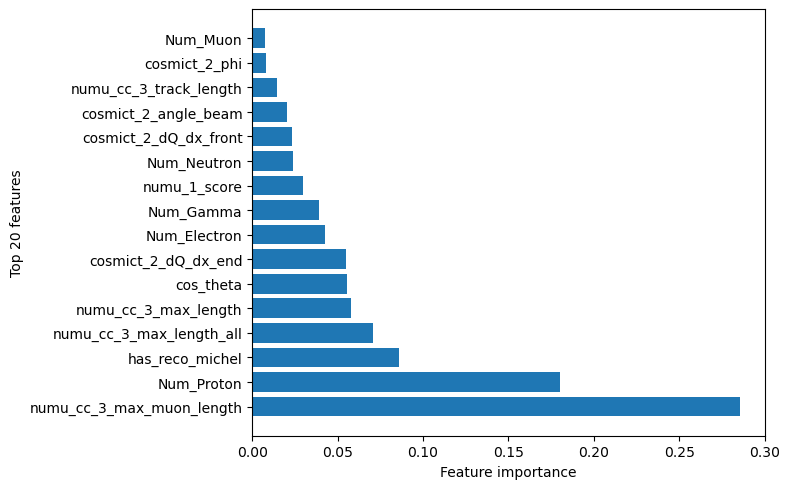

In [21]:
list_features = plot_important_features(training_variables, clf.feature_importances_, 20)

In [22]:
!pip install shap

In [23]:
# Explain predictions using SHAP
explainer = shap.Explainer(clf)
shap_values = explainer(features_test)

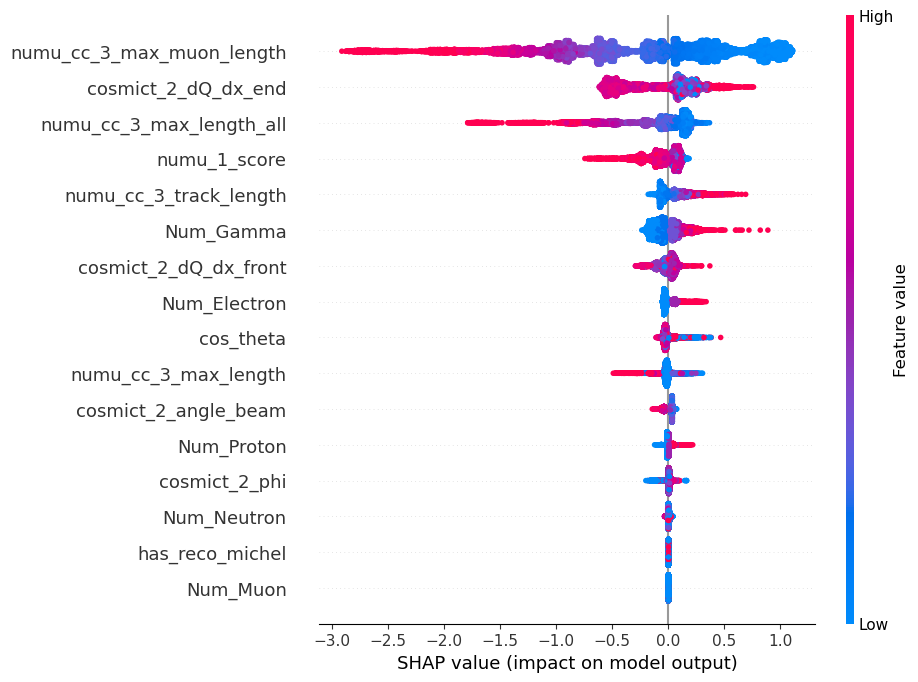

In [24]:
# Each prediction has shape [n_samples, n_classes, n_features]
# For summary plot, use per-class SHAP values
# To visualize class 0:
shap.plots.beeswarm(shap_values[..., 0], max_display=20)

# To visualize class 1 or 2:
# shap.plots.beeswarm(shap_values[..., 1])
# shap.plots.beeswarm(shap_values[..., 2])

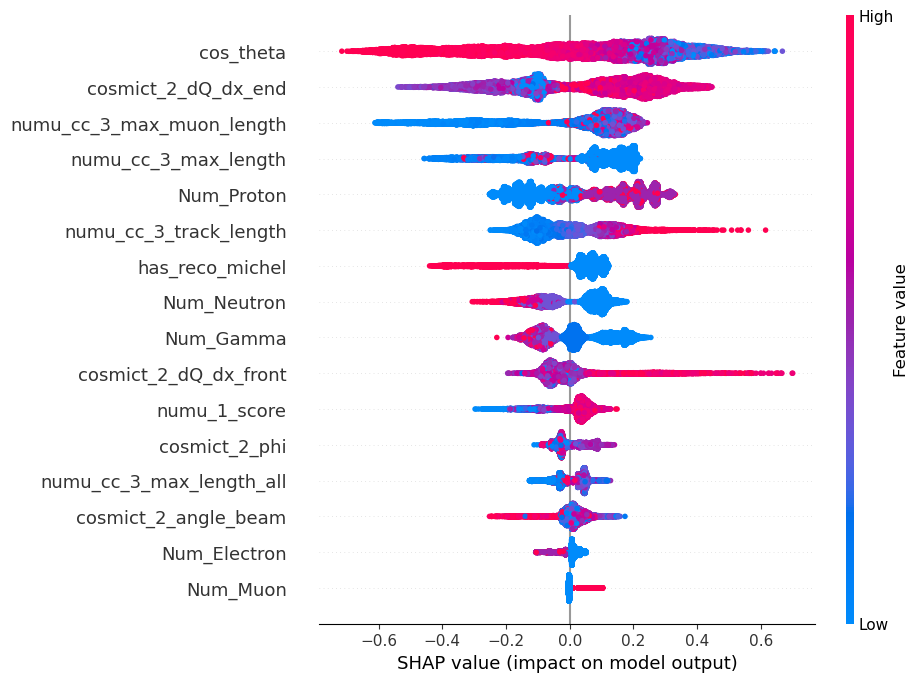

In [25]:
shap.plots.beeswarm(shap_values[..., 1], max_display=20)

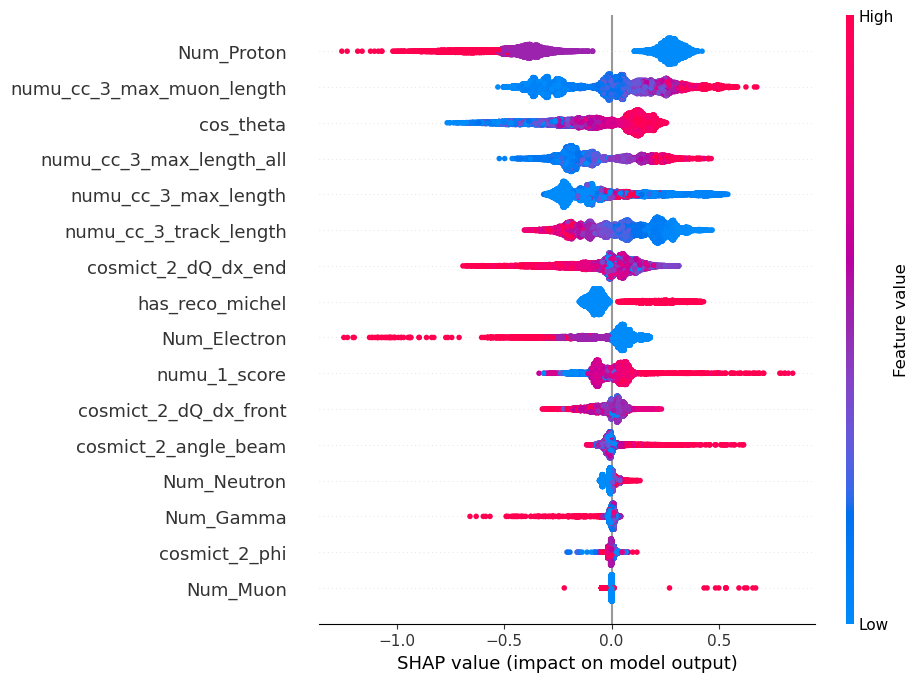

In [26]:
shap.plots.beeswarm(shap_values[..., 2], max_display=20)

Plot the BDT Score Distribution

[0.29568207 0.02418978 0.2196056  ... 0.07646468 0.7411613  0.07171576]
[0.3991523  0.86007464 0.35808215 ... 0.8704195  0.15784477 0.8635125 ]
[0.30516565 0.11573555 0.42231226 ... 0.05311582 0.10099398 0.06477173]


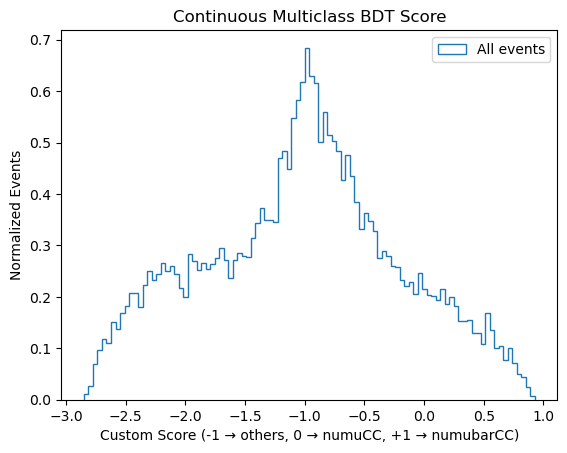

In [27]:
P0 = y_proba[:,0]  # others
P1 = y_proba[:,1]  # numuCC
P2 = y_proba[:,2]  # numubarCC

print(P0)
print(P1)
print(P2)

# Compute custom continuous score
score = -3*P0 - P1 + P2  # Custom score: -3 → others, -1 → numuCC, +1 → numubarCC; score = -3 * P0 - 1 * P1 + 1 * P2

# Plot the distribution of the custom score
plt.hist(score, bins=100, density=True, histtype='step', label='All events')
plt.xlabel('Custom Score (-1 → others, 0 → numuCC, +1 → numubarCC)')
plt.ylabel('Normalized Events')
plt.title('Continuous Multiclass BDT Score')
plt.legend()
plt.show()


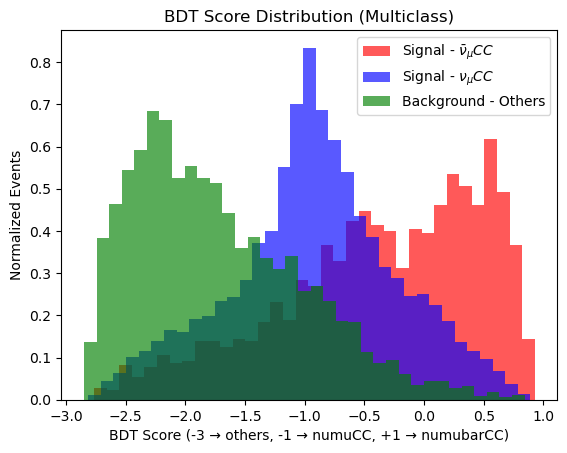

In [28]:
plt.hist(score[targets_test==2], bins=35, alpha=0.65, label=r'Signal - $\bar{\nu}_{\mu}CC$', color='red', density=True)
plt.hist(score[targets_test==1], bins=35, alpha=0.65, label=r'Signal - $\nu_{\mu}CC$', color='blue', density=True)
plt.hist(score[targets_test==0], bins=35, alpha=0.65, label='Background - Others', color='green', density=True)

plt.xlabel('BDT Score (-3 → others, -1 → numuCC, +1 → numubarCC)')
plt.ylabel('Normalized Events')
plt.title('BDT Score Distribution (Multiclass)')
plt.legend()
plt.show()

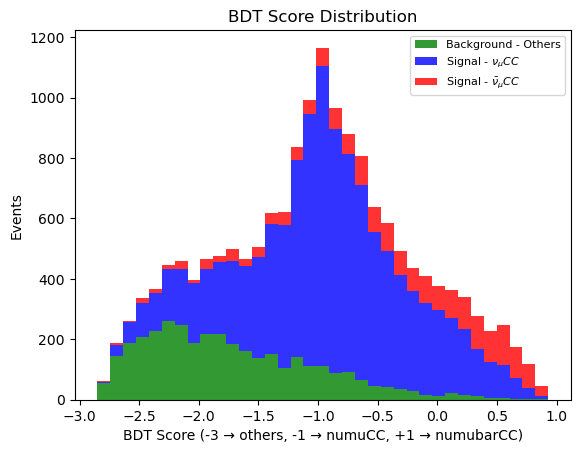

In [29]:
plt.hist(
    [score[targets_test == 0], score[targets_test == 1], score[targets_test == 2]],
    bins=35,
    stacked=True,
    color=['green', 'blue', 'red'],
    label=[
        'Background - Others',
        r'Signal - $\nu_{\mu}CC$',
        r'Signal - $\bar{\nu}_{\mu}CC$'
    ],
    density=False,
    alpha=0.8,
    log=False  # Enables log scale on the y-axis
)

plt.xlabel('BDT Score (-3 → others, -1 → numuCC, +1 → numubarCC)')
plt.ylabel('Events')
plt.title('BDT Score Distribution')
plt.legend(fontsize='8')
plt.show()


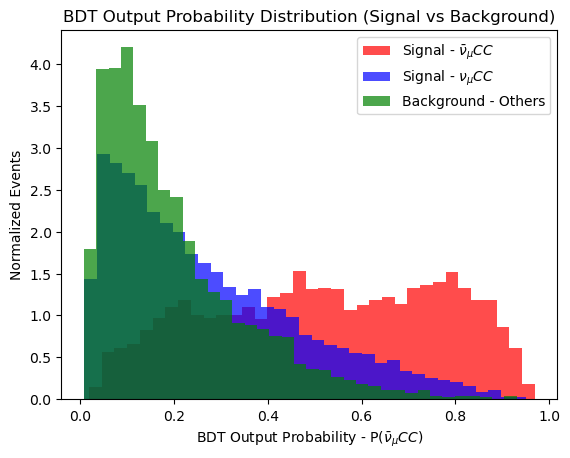

In [30]:
plt.hist(bdt_score_numubarcc[targets_test == 2], bins=35, alpha=0.7, label=r'Signal - $\bar{\nu}_{\mu}CC$', color='red', density=True)
plt.hist(bdt_score_numubarcc[targets_test == 1], bins=35, alpha=0.7, label=r'Signal - $\nu_{\mu}CC$', color='blue', density=True)
plt.hist(bdt_score_numubarcc[targets_test == 0], bins=35, alpha=0.7, label='Background - Others', color='green', density=True)
plt.xlabel(r'BDT Output Probability - P($\bar{\nu}_{\mu}CC$)')
plt.ylabel('Normalized Events')
plt.title('BDT Output Probability Distribution (Signal vs Background)')
plt.legend()
plt.show()

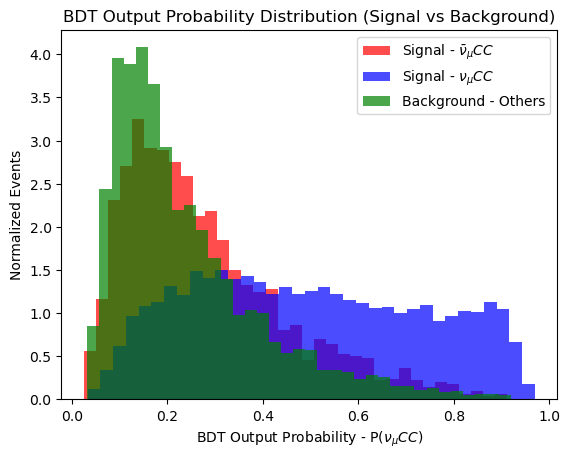

In [31]:
plt.hist(bdt_score_numucc[targets_test == 2], bins=35, alpha=0.7, label=r'Signal - $\bar{\nu}_{\mu}CC$', color='red', density=True)
plt.hist(bdt_score_numucc[targets_test == 1], bins=35, alpha=0.7, label=r'Signal - $\nu_{\mu}CC$', color='blue', density=True)
plt.hist(bdt_score_numucc[targets_test == 0], bins=35, alpha=0.7, label='Background - Others', color='green', density=True)
plt.xlabel(r'BDT Output Probability - P($\nu_{\mu}CC$)')
plt.ylabel('Normalized Events')
plt.title('BDT Output Probability Distribution (Signal vs Background)')
plt.legend()
plt.show()

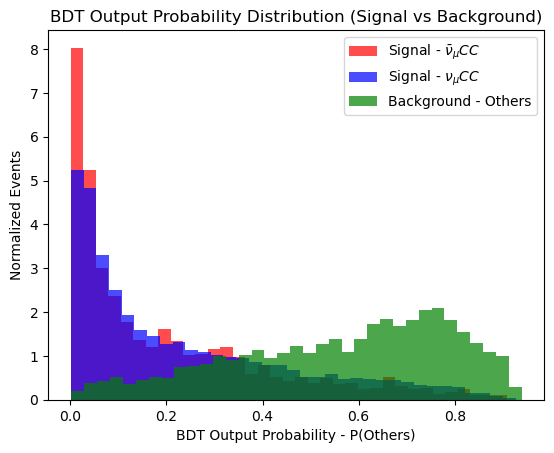

In [32]:
plt.hist(bdt_score_others[targets_test == 2], bins=35, alpha=0.7, label=r'Signal - $\bar{\nu}_{\mu}CC$', color='red', density=True)
plt.hist(bdt_score_others[targets_test == 1], bins=35, alpha=0.7, label=r'Signal - $\nu_{\mu}CC$', color='blue', density=True)
plt.hist(bdt_score_others[targets_test == 0], bins=35, alpha=0.7, label='Background - Others', color='green', density=True)
plt.xlabel(r'BDT Output Probability - P(Others)')
plt.ylabel('Normalized Events')
plt.title('BDT Output Probability Distribution (Signal vs Background)')
plt.legend()
plt.show()

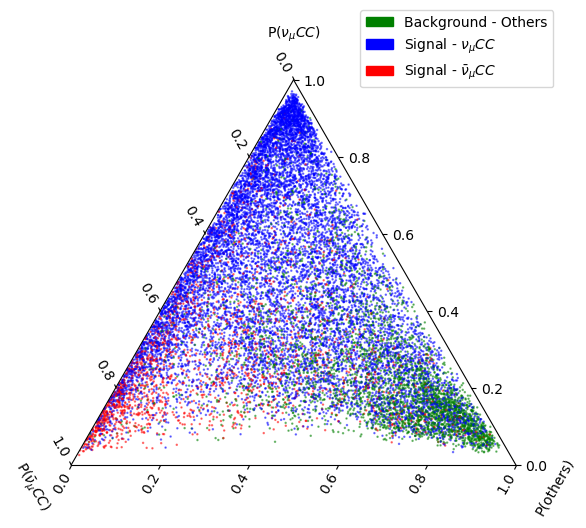

In [33]:
# Subsample the data (e.g., 30% of the data)
sample_size = int(1. * len(P1))  # Adjust 0.3 to the percentage you want
random_indices = np.random.choice(len(P1), size=sample_size, replace=False)

# Get the subsampled data
P1_subsample = np.array(P1)[random_indices]
P2_subsample = np.array(P2)[random_indices]
P0_subsample = np.array(P0)[random_indices]
targets_test_subsample = np.array(targets_test)[random_indices]

# Color mapping by class
color_map = {0: 'green', 1: 'blue', 2: 'red'}
label_map = {0: 'Background - Others', 1: r'Signal - $\nu_{\mu}CC$', 2: r'Signal - $\bar{\nu}_{\mu}CC$'}
colors = [color_map[label] for label in targets_test_subsample]

# Plot
fig = plt.figure(figsize=(6, 5))
ax = fig.add_subplot(1, 1, 1, projection='ternary')
sc = ax.scatter(P1_subsample, P2_subsample, P0_subsample, c=colors, alpha=0.5, s=0.6)

# Labels on triangle sides
ax.set_tlabel(r'P($\nu_{\mu}CC$)')
ax.set_llabel(r'P($\bar{\nu}_{\mu}CC$)')
ax.set_rlabel('P(others)')

# Legend
handles = [mpatches.Patch(color=clr, label=label_map[key]) for key, clr in color_map.items()]
plt.legend(handles=handles, loc='upper right', bbox_to_anchor=(1.1, 1.2))

plt.show()


In [34]:
# # Suppose cos_theta is your array of cos(theta) values (same length as P1, P2, P0)
# # For example:
# # cos_theta = np.array([...])  # your data here

# # Subsample if needed (optional, but as before)
# sample_size = int(1.0 * len(P1))
# random_indices = np.random.choice(len(P1), size=sample_size, replace=False)

# P1_subsample = np.array(P1)[random_indices]
# P2_subsample = np.array(P2)[random_indices]
# P0_subsample = np.array(P0)[random_indices]
# cos_theta_subsample = np.array(features_test["cos_theta"])[random_indices]

# # Plot
# fig = plt.figure(figsize=(7, 6))
# ax = fig.add_subplot(1, 1, 1, projection='ternary')

# # Scatter with continuous coloring based on cos(theta)
# sc = ax.scatter(P1_subsample, P2_subsample, P0_subsample,
#                 c=cos_theta_subsample, cmap='viridis',  # you can change cmap here
#                 alpha=0.4, s=1.2)

# # Labels on triangle sides
# ax.set_tlabel(r'P($\nu_{\mu}CC$)')
# ax.set_llabel(r'P($\bar{\nu}_{\mu}CC$)')
# ax.set_rlabel('P(others)')

# # Add color bar
# cbar = fig.colorbar(sc, ax=ax, fraction=0.03, pad=0.02)
# cbar.set_label(r'$\cos(\theta)$')

# plt.tight_layout()
# plt.show()


In [35]:
# # Suppose cos_theta is your array of cos(theta) values (same length as P1, P2, P0)
# # For example:
# # cos_theta = np.array([...])  # your data here

# # Subsample if needed (optional, but as before)
# sample_size = int(1. * len(P1))
# random_indices = np.random.choice(len(P1), size=sample_size, replace=False)

# P1_subsample = np.array(P1)[random_indices]
# P2_subsample = np.array(P2)[random_indices]
# P0_subsample = np.array(P0)[random_indices]
# num_proton_subsample = np.array(features_test["Num_Proton"])[random_indices]

# # Plot
# fig = plt.figure(figsize=(7, 6))
# ax = fig.add_subplot(1, 1, 1, projection='ternary')

# # Scatter with continuous coloring based on cos(theta)
# sc = ax.scatter(P1_subsample, P2_subsample, P0_subsample,
#                 c=num_proton_subsample, cmap='viridis',  # you can change cmap here
#                 alpha=0.6, s=0.9)

# # Labels on triangle sides
# ax.set_tlabel(r'P($\nu_{\mu}CC$)')
# ax.set_llabel(r'P($\bar{\nu}_{\mu}CC$)')
# ax.set_rlabel('P(others)')

# # Add color bar
# cbar = fig.colorbar(sc, ax=ax, fraction=0.03, pad=0.02)
# cbar.set_label("Proton Multiplicity")

# plt.tight_layout()
# plt.show()


In [36]:
# # Subsample if needed (optional, but as before)
# sample_size = int(1. * len(P1))
# random_indices = np.random.choice(len(P1), size=sample_size, replace=False)

# P1_subsample = np.array(P1)[random_indices]
# P2_subsample = np.array(P2)[random_indices]
# P0_subsample = np.array(P0)[random_indices]
# mu_energy_subsample = np.array(features_test["truth_cos_theta"])[random_indices]

# # Plot
# fig = plt.figure(figsize=(7, 6))
# ax = fig.add_subplot(1, 1, 1, projection='ternary')

# # Scatter with continuous coloring based on cos(theta)
# sc = ax.scatter(P1_subsample, P2_subsample, P0_subsample,
#                 c=mu_energy_subsample, cmap='viridis',  # you can change cmap here
#                 alpha=0.4, s=1.2)

# # Labels on triangle sides
# ax.set_tlabel(r'P($\nu_{\mu}CC$)')
# ax.set_llabel(r'P($\bar{\nu}_{\mu}CC$)')
# ax.set_rlabel('P(others)')

# # Add color bar
# cbar = fig.colorbar(sc, ax=ax, fraction=0.03, pad=0.02)
# cbar.set_label(r"Reconstructed Michel-Muon cos(\theta)")

# plt.tight_layout()
# plt.show()

In [37]:
# # Suppose cos_theta is your array of cos(theta) values (same length as P1, P2, P0)
# # For example:
# # cos_theta = np.array([...])  # your data here

# # Subsample if needed (optional, but as before)
# sample_size = int(1. * len(P1))
# random_indices = np.random.choice(len(P1), size=sample_size, replace=False)

# P1_subsample = np.array(P1)[random_indices]
# P2_subsample = np.array(P2)[random_indices]
# P0_subsample = np.array(P0)[random_indices]
# num_proton_subsample = np.array(features_test["Truth_Num_Proton"])[random_indices]

# # Plot
# fig = plt.figure(figsize=(7, 6))
# ax = fig.add_subplot(1, 1, 1, projection='ternary')

# # Scatter with continuous coloring based on cos(theta)
# sc = ax.scatter(P1_subsample, P2_subsample, P0_subsample,
#                 c=num_proton_subsample, cmap='viridis',  # you can change cmap here
#                 alpha=0.6, s=0.9)

# # Labels on triangle sides
# ax.set_tlabel(r'P($\nu_{\mu}CC$)')
# ax.set_llabel(r'P($\bar{\nu}_{\mu}CC$)')
# ax.set_rlabel('P(others)')

# # Add color bar
# cbar = fig.colorbar(sc, ax=ax, fraction=0.03, pad=0.02)
# cbar.set_label("Proton Multiplicity")

# plt.tight_layout()
# plt.show()


## Truth version

In [38]:
# # Subsample if needed (optional, but as before)
# sample_size = int(1. * len(P1))
# random_indices = np.random.choice(len(P1), size=sample_size, replace=False)

# P1_subsample = np.array(P1)[random_indices]
# P2_subsample = np.array(P2)[random_indices]
# P0_subsample = np.array(P0)[random_indices]
# mu_energy_subsample = np.array(features_test["has_truth_michel"])[random_indices]

# # Plot
# fig = plt.figure(figsize=(7, 6))
# ax = fig.add_subplot(1, 1, 1, projection='ternary')

# # Scatter with continuous coloring based on cos(theta)
# sc = ax.scatter(P1_subsample, P2_subsample, P0_subsample,
#                 c=mu_energy_subsample, cmap='viridis',  # you can change cmap here
#                 alpha=0.4, s=1.2)

# # Labels on triangle sides
# ax.set_tlabel(r'P($\nu_{\mu}CC$)')
# ax.set_llabel(r'P($\bar{\nu}_{\mu}CC$)')
# ax.set_rlabel('P(others)')

# # Add color bar
# cbar = fig.colorbar(sc, ax=ax, fraction=0.03, pad=0.02)
# cbar.set_label("Truth Michel Presence (A.U.)")

# plt.tight_layout()
# plt.show()

In [39]:
# # Subsample if needed (optional, but as before)
# sample_size = int(1. * len(P1))
# random_indices = np.random.choice(len(P1), size=sample_size, replace=False)

# P1_subsample = np.array(P1)[random_indices]
# P2_subsample = np.array(P2)[random_indices]
# P0_subsample = np.array(P0)[random_indices]
# mu_energy_subsample = np.array(features_test["truth_michel_energy"]*1000)[random_indices]

# # Plot
# fig = plt.figure(figsize=(7, 6))
# ax = fig.add_subplot(1, 1, 1, projection='ternary')

# # Scatter with continuous coloring based on cos(theta)
# sc = ax.scatter(P1_subsample, P2_subsample, P0_subsample,
#                 c=mu_energy_subsample, cmap='viridis',  # you can change cmap here
#                 alpha=0.4, s=1.2)

# # Labels on triangle sides
# ax.set_tlabel(r'P($\nu_{\mu}CC$)')
# ax.set_llabel(r'P($\bar{\nu}_{\mu}CC$)')
# ax.set_rlabel('P(others)')

# # Add color bar
# cbar = fig.colorbar(sc, ax=ax, fraction=0.03, pad=0.02)
# cbar.set_label("Truth Michel Energy (MeV)")

# plt.tight_layout()
# plt.show()

In [40]:
# # Subsample if needed (optional, but as before)
# sample_size = int(1. * len(P1))
# random_indices = np.random.choice(len(P1), size=sample_size, replace=False)

# P1_subsample = np.array(P1)[random_indices]
# P2_subsample = np.array(P2)[random_indices]
# P0_subsample = np.array(P0)[random_indices]
# mu_energy_subsample = np.array(features_test["truth_michel_muon_costheta"])[random_indices]

# # Plot
# fig = plt.figure(figsize=(7, 6))
# ax = fig.add_subplot(1, 1, 1, projection='ternary')

# # Scatter with continuous coloring based on cos(theta)
# sc = ax.scatter(P1_subsample, P2_subsample, P0_subsample,
#                 c=mu_energy_subsample, cmap='viridis',  # you can change cmap here
#                 alpha=0.4, s=1.2)

# # Labels on triangle sides
# ax.set_tlabel(r'P($\nu_{\mu}CC$)')
# ax.set_llabel(r'P($\bar{\nu}_{\mu}CC$)')
# ax.set_rlabel('P(others)')

# # Add color bar
# cbar = fig.colorbar(sc, ax=ax, fraction=0.03, pad=0.02)
# cbar.set_label(r"Truth Michel-Muon cos($\theta$)")

# plt.tight_layout()
# plt.show()

# Plotting ROC Curves (each class vs rest)

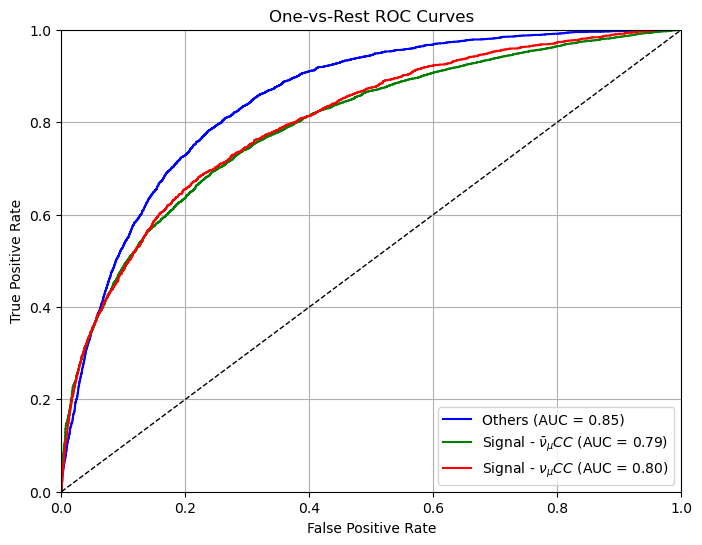

In [41]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Assume targets_test and y_proba from your test set
# targets_test ∈ {0,1,2}
# y_proba.shape = (n_samples, 3)

# Binarize the true labels for multiclass ROC
targets_test_bin = label_binarize(targets_test, classes=[0,1,2])  # shape (n_samples, 3)

# Compute ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes = 3

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(targets_test_bin[:, i], y_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(8,6))
colors = ['blue', 'green', 'red']
labels = ['Others', r'Signal - $\bar{\nu}_{\mu}CC$', r'Signal - $\nu_{\mu}CC$']

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors[i],
             label=f'{labels[i]} (AUC = {roc_auc[i]:0.2f})')

plt.plot([0,1], [0,1], 'k--', lw=1)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('One-vs-Rest ROC Curves')
plt.legend(loc="lower right")
plt.grid()
plt.show()


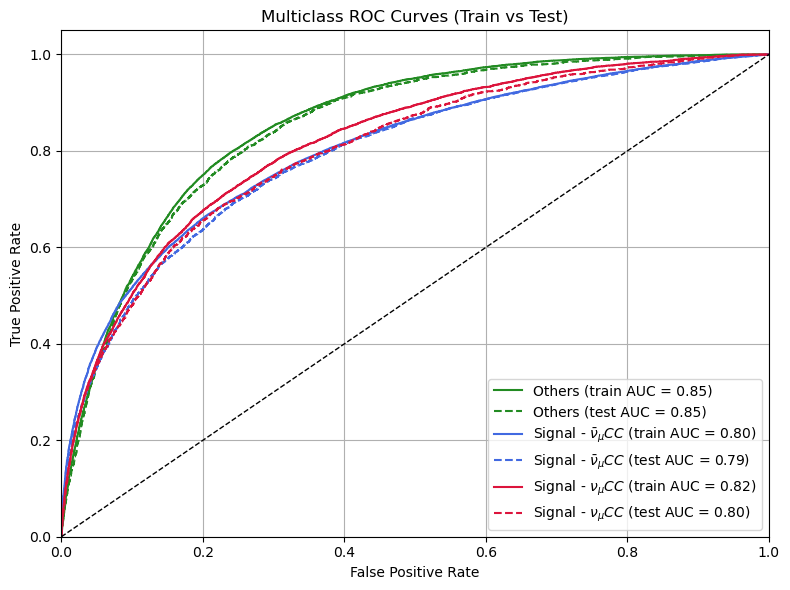

In [42]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# ---- Predict probabilities ----
y_proba_train = clf.predict_proba(features_train)  # shape (n_train, 3)
y_proba_test = clf.predict_proba(features_test)    # shape (n_test, 3)

# ---- Binarize targets ----
classes = [0, 1, 2]  # others, numuCC, numubarCC
targets_train_bin = label_binarize(targets_train, classes=classes)
targets_test_bin  = label_binarize(targets_test, classes=classes)

# ---- Compute ROC + AUC for train/test, per class ----
fpr_train, tpr_train, auc_train = {}, {}, {}
fpr_test, tpr_test, auc_test = {}, {}, {}
n_classes = len(classes)

for i in range(n_classes):
    fpr_train[i], tpr_train[i], _ = roc_curve(targets_train_bin[:, i], y_proba_train[:, i])
    auc_train[i] = auc(fpr_train[i], tpr_train[i])
    
    fpr_test[i], tpr_test[i], _ = roc_curve(targets_test_bin[:, i], y_proba_test[:, i])
    auc_test[i] = auc(fpr_test[i], tpr_test[i])

# ---- Plot ----
plt.figure(figsize=(8,6))
colors = ['forestgreen', 'royalblue', 'crimson']
labels = ['Others', r'Signal - $\bar{\nu}_{\mu}CC$', r'Signal - $\nu_{\mu}CC$']

for i in range(n_classes):
    plt.plot(fpr_train[i], tpr_train[i], color=colors[i], linestyle='-', 
             label=f'{labels[i]} (train AUC = {auc_train[i]:.2f})')
    plt.plot(fpr_test[i], tpr_test[i], color=colors[i], linestyle='--', 
             label=f'{labels[i]} (test AUC = {auc_test[i]:.2f})')

plt.plot([0,1], [0,1], 'k--', lw=1)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass ROC Curves (Train vs Test)')
plt.legend(loc="lower right")
plt.grid()
plt.tight_layout()
plt.show()


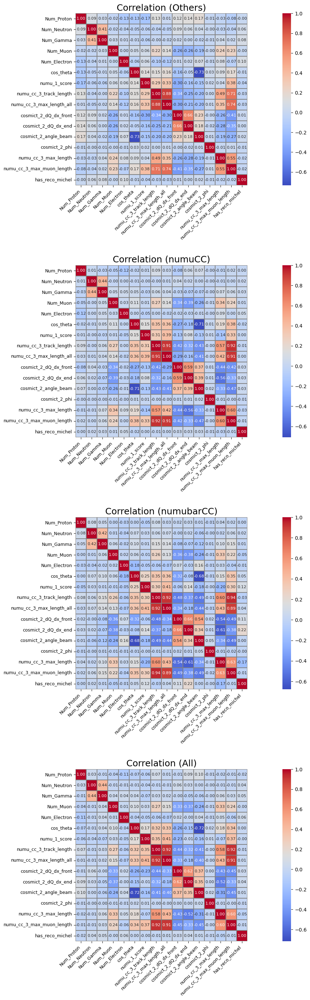

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

# Split the dataframe by class label
df_others = df_bdt[df_bdt["bdt_multi_label"] == 0]
df_numu   = df_bdt[df_bdt["bdt_multi_label"] == 1]
df_numubar = df_bdt[df_bdt["bdt_multi_label"] == 2]

# Compute correlation matrices
corr_others = df_others[training_variables].corr()
corr_numu = df_numu[training_variables].corr()
corr_numubar = df_numubar[training_variables].corr()
corr_all = df_bdt[training_variables].corr()

fig, axes = plt.subplots(4, 1, figsize=(20, 28))  # Wider and taller
titles = ["Correlation (Others)", "Correlation (numuCC)", "Correlation (numubarCC)", "Correlation (All)"]
corr_matrices = [corr_others, corr_numu, corr_numubar, corr_all]

for ax, corr, title in zip(axes, corr_matrices, titles):
    sns.heatmap(
        corr,
        annot=True,
        fmt=".2f",  # Fewer decimal places
        cmap="coolwarm",
        ax=ax,
        cbar=True,
        square=True,
        annot_kws={"size": 8},  # Smaller font for numbers
        linewidths=0.3,
        linecolor='gray'
    )
    ax.set_title(title, fontsize=18)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=9)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=9)

plt.tight_layout(h_pad=3.0)  # Add vertical padding between plots
plt.show()


In [44]:
# # First Calulate BDT score
# #df_bdt.loc[:,bdt_score] = clf.predict_proba(df_bdt[training_variables])[:,1]
# df_bdt['bdt_score'] = clf.predict_proba(df_bdt[training_variables])[:,1]

# y_pred_proba_sig_train = clf.predict_proba(features_test_sig)
# y_pred_proba_bkg_train = clf.predict_proba(features_test_bkg)
# bdtScoreSigTrain = y_pred_proba_sig_train[:,-1]
# bdtScoreBkgTrain = y_pred_proba_bkg_train[:,-1]

In [45]:
# plt.hist(bdtScoreSigTrain, 25, color='orange', range=(0.,1.), label=r'Signal - $\bar{\nu}_{\mu}CC$', alpha=0.5, density=False)
# plt.hist(bdtScoreBkgTrain, 25, color='green', range=(0.,1.), label= r'Background - $\nu_{\mu}CC$ and Others', alpha=0.5, density=False)

# plt.xlabel("BDT Prediction Score")
# plt.ylabel("Entries")
# plt.legend(fontsize=8, loc='best', frameon=False)
# plt.show()

In [46]:
# cut = 0.76
# signal_cut = bdtScoreSigTrain[bdtScoreSigTrain>=cut]
# bkg_cut = bdtScoreBkgTrain[bdtScoreBkgTrain>=cut]

# signal_cut_accuracy = signal_cut.size/(signal_cut.size+bkg_cut.size)
# bkg_cut_accuracy = bkg_cut.size/(signal_cut.size+bkg_cut.size)
# print("the sig accuracy %.3f and bkg accuracy is %.3f" % (signal_cut_accuracy, bkg_cut_accuracy))
# print(signal_cut.size)
# print(bkg_cut.size)
# print(bdtScoreSigTrain.size)

In [47]:
# plot signal and background separately
# plt.figure();
# plt.hist(predictions[test.get_label().astype(bool)],bins=np.linspace(0,1,50),
#          histtype='step',color='midnightblue',label='signal');
# plt.hist(predictions[~(test.get_label().astype(bool))],bins=np.linspace(0,1,50),
#          histtype='step',color='firebrick',label='background');
# # make the plot readable
# plt.xlabel('Prediction from BDT',fontsize=12);
# plt.ylabel('Events',fontsize=12);
# plt.legend(frameon=False);

Plot the confusion matrix

In [48]:
# mc_y_pred = clf.predict(features_test)

# group_names = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
# cm_mc = confusion_matrix(targets_test, mc_y_pred)
# test_counts = ["{0:0.0f}".format(value) for value in cm_mc.flatten()]
# test_percentage = ["{0:.2%}".format(value) for value in cm_mc.flatten()/np.sum(cm_mc)]
# test_labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,test_counts,test_percentage)]
# test_labels = np.asarray(test_labels).reshape(2,2)
# ax= plt.subplot()
# sns.heatmap(cm_mc, annot=test_labels, fmt='', cmap='Blues', ax=ax);
# tn, fp, fn, tp = cm_mc.ravel()
# print(tn, fp, fn, tp)
# # labels, title and ticks

# ax.set_title('BDT Model Confusion Matrix'); 
# ax.set_xlabel("Predicted Label")
# ax.set_ylabel("True Label")
# ax.xaxis.set_ticklabels(['Negative', 'Positive']); 
# ax.yaxis.set_ticklabels(['Negative', 'Positive']);

## Plotting Particle Multiplicity

In [49]:
# First set a mask for plotting multiplicity
df_numucc = df_bdt.query('bdt_multi_label==1')
df_numubar = df_bdt.query('bdt_multi_label==2')
df_others = df_bdt.query('bdt_multi_label==0')

In [50]:
df_bdt.head()

,kine_reco_Enu,kine_pio_mass,kine_pio_flag,kine_pio_vtx_dis,kine_pio_energy_1,kine_pio_energy_2,kine_pio_dis_1,kine_pio_dis_2,kine_pio_angle,numu_cc_flag,...,truth_michel_pz,truth_muon_px,truth_muon_py,truth_muon_pz,norm_truth_michel,norm_truth_muon,bdt_numubarcc_label,bdt_numucc_label,bdt_others_label,bdt_multi_label
8,408.224762,0.0,0,1000.0,0.0,0.0,0.0,0.0,0.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,1,0
15,787.727844,0.0,0,1000.0,0.0,0.0,0.0,0.0,0.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,1
26,239.620544,0.0,0,1000.0,0.0,0.0,0.0,0.0,0.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,1,0
31,653.124268,0.0,0,1000.0,0.0,0.0,0.0,0.0,0.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,1
37,420.558807,0.0,0,1000.0,0.0,0.0,0.0,0.0,0.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,1


In [51]:
def plot_discrete_multiplicity(df_numucc, df_numubar, df_others,
                               column, xlabel, max_val=None, width=0.2):
    """
    Plot side-by-side bar distributions for a discrete multiplicity variable.

    Parameters
    ----------
    df_numucc : pd.DataFrame
        DataFrame for νμCC events
    df_numubar : pd.DataFrame
        DataFrame for ν̄μCC events
    df_others : pd.DataFrame
        DataFrame for other events
    column : str
        Column name to plot (e.g., 'Truth_Num_Proton', 'Num_Gamma')
    xlabel : str
        X-axis label
    max_val : int or None
        Maximum multiplicity to plot (bins go from 0..max_val).
        If None, inferred from the three DataFrames.
    width : float
        Width of each bar (controls spacing between groups).
    """

    # Auto-determine range if not provided
    if max_val is None:
        max_val = int(max(
            df_numucc[column].max(),
            df_numubar[column].max(),
            df_others[column].max()
        )) + 1

    bins = np.arange(0, max_val + 1)

    # Histogram counts
    counts_numu, _    = np.histogram(df_numucc[column], bins=bins)
    counts_numubar, _ = np.histogram(df_numubar[column], bins=bins)
    counts_others, _  = np.histogram(df_others[column], bins=bins)

    # Normalize each to area = 1
    counts_numu    = counts_numu / counts_numu.sum() if counts_numu.sum() > 0 else counts_numu
    counts_numubar = counts_numubar / counts_numubar.sum() if counts_numubar.sum() > 0 else counts_numubar
    counts_others  = counts_others / counts_others.sum() if counts_others.sum() > 0 else counts_others

    x = bins[:-1]  # integer values

    plt.bar(x - width, counts_numu, width=width,
            label=r'$\nu_{\mu}CC$', color='blue', alpha=0.6, hatch='\\\\')
    plt.bar(x, counts_numubar, width=width,
            label=r'$\bar{\nu}_{\mu}CC$', color='maroon', alpha=0.6, hatch='////')
    plt.bar(x + width, counts_others, width=width,
            label='Others', color='paleturquoise', alpha=0.6, hatch='//')

    plt.xticks(x, x)
    plt.xlabel(xlabel)
    plt.ylabel("Area Normalized")
    plt.legend()
    plt.tight_layout()
    plt.show()


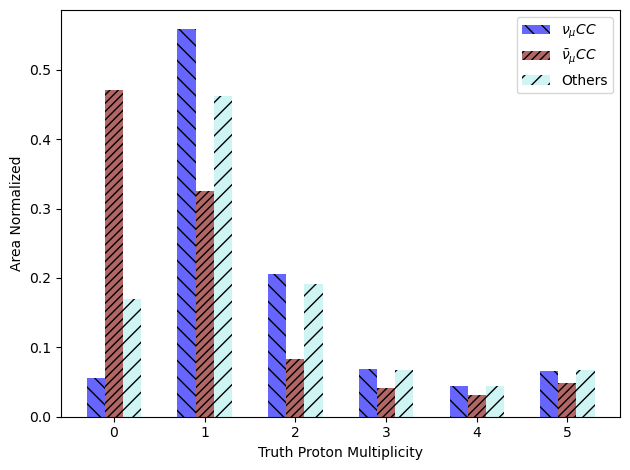

In [52]:
plot_discrete_multiplicity(df_numucc, df_numubar, df_others,
                           column="Truth_Num_Proton",
                           xlabel="Truth Proton Multiplicity",
                           max_val=6)

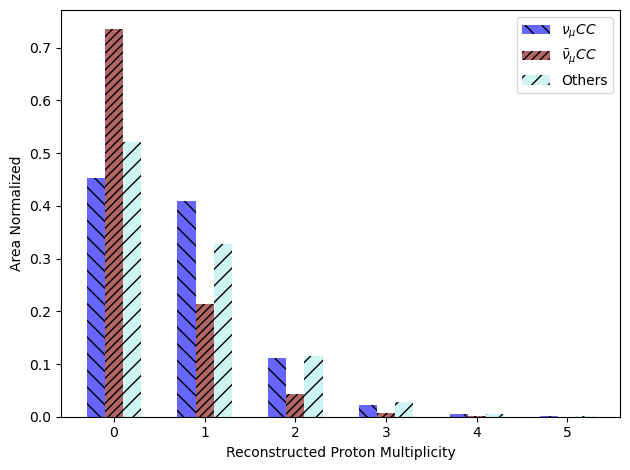

In [53]:
plot_discrete_multiplicity(df_numucc, df_numubar, df_others,
                           column="Num_Proton",
                           xlabel="Reconstructed Proton Multiplicity",
                           max_val=6)

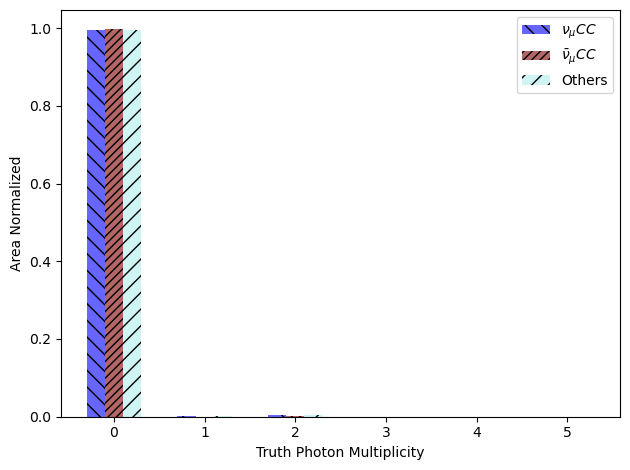

In [54]:
plot_discrete_multiplicity(df_numucc, df_numubar, df_others,
                           column="Truth_Num_Gamma",
                           xlabel="Truth Photon Multiplicity",
                           max_val=6)

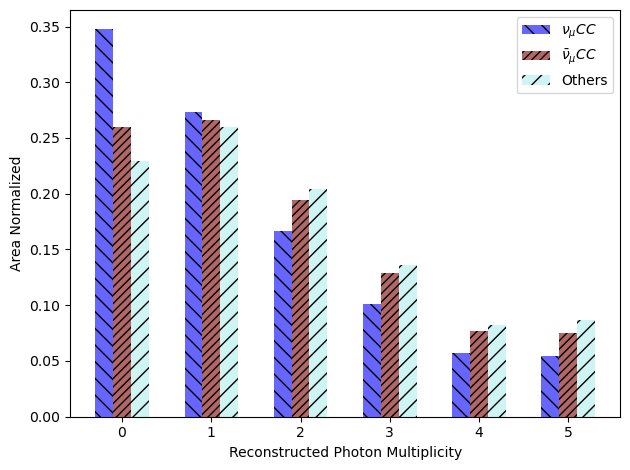

In [55]:
plot_discrete_multiplicity(df_numucc, df_numubar, df_others,
                           column="Num_Gamma",
                           xlabel="Reconstructed Photon Multiplicity",
                           max_val=6)

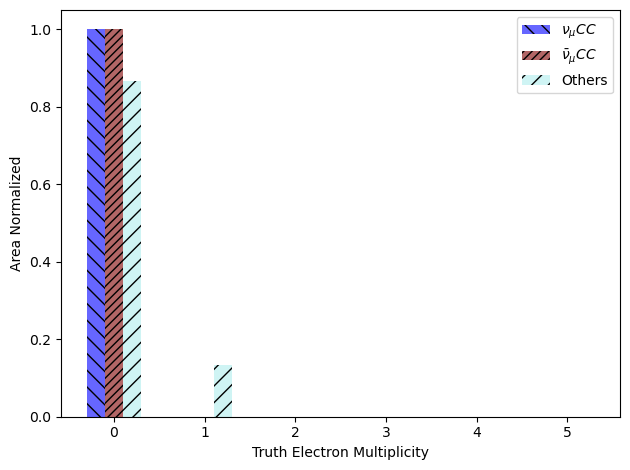

In [56]:
plot_discrete_multiplicity(df_numucc, df_numubar, df_others,
                           column="Truth_Num_Electron",
                           xlabel="Truth Electron Multiplicity",
                           max_val=6)

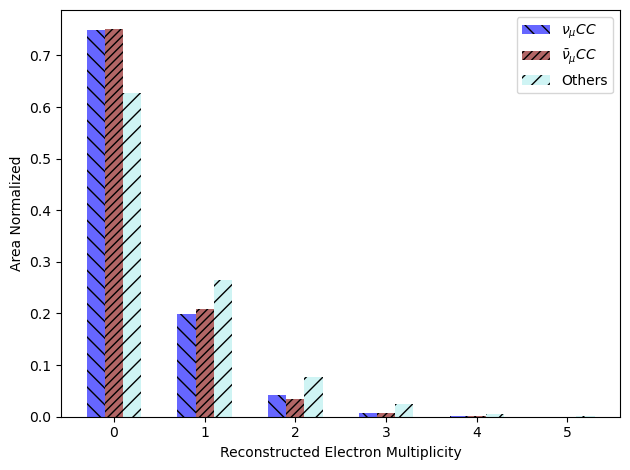

In [57]:
plot_discrete_multiplicity(df_numucc, df_numubar, df_others,
                           column="Num_Electron",
                           xlabel="Reconstructed Electron Multiplicity",
                           max_val=6)

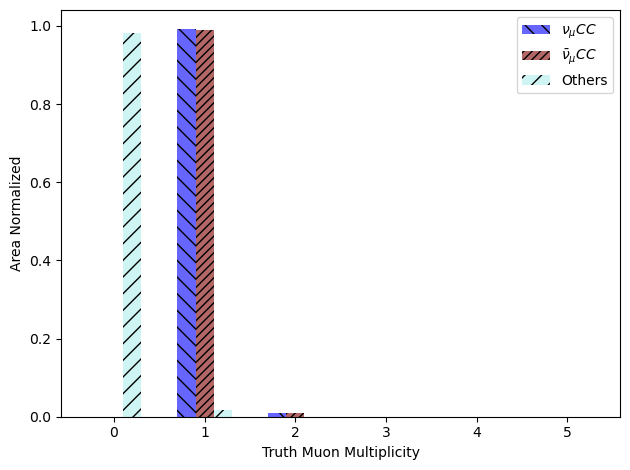

In [58]:
plot_discrete_multiplicity(df_numucc, df_numubar, df_others,
                           column="Truth_Num_Muon",
                           xlabel="Truth Muon Multiplicity",
                           max_val=6)

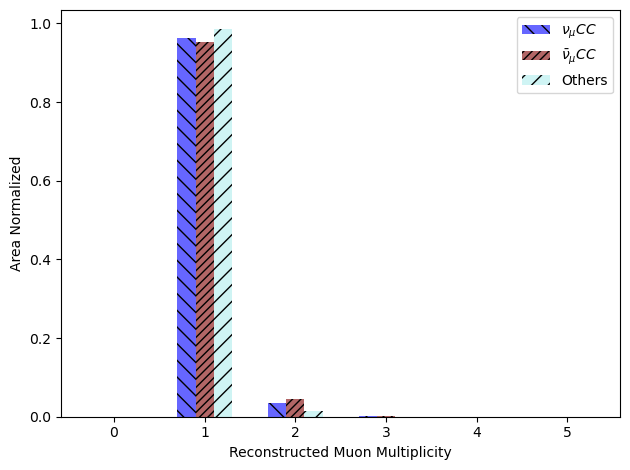

In [59]:
plot_discrete_multiplicity(df_numucc, df_numubar, df_others,
                           column="Num_Muon",
                           xlabel="Reconstructed Muon Multiplicity",
                           max_val=6)

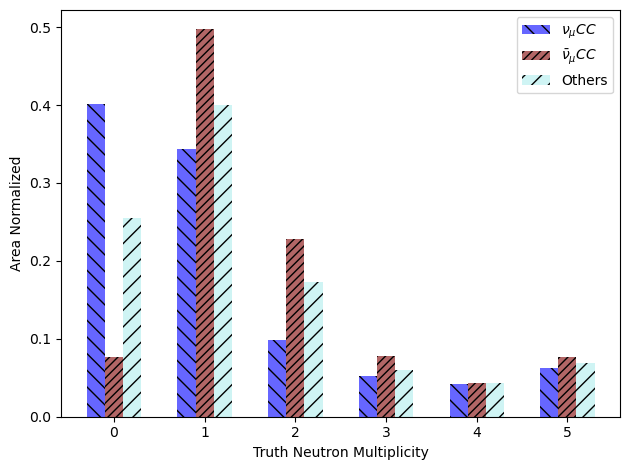

In [60]:
plot_discrete_multiplicity(df_numucc, df_numubar, df_others,
                           column="Truth_Num_Neutron",
                           xlabel="Truth Neutron Multiplicity",
                           max_val=6)

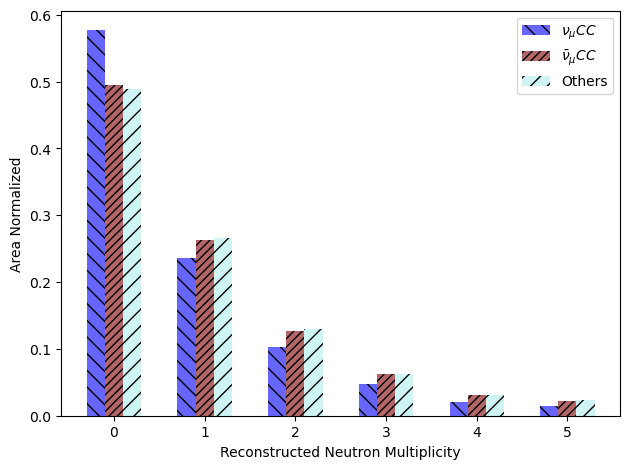

In [61]:
plot_discrete_multiplicity(df_numucc, df_numubar, df_others,
                           column="Num_Neutron",
                           xlabel="Reconstructed Neutron Multiplicity",
                           max_val=6)

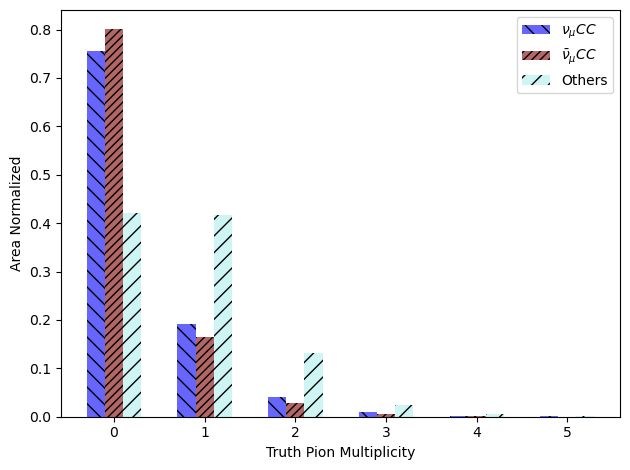

In [62]:
plot_discrete_multiplicity(df_numucc, df_numubar, df_others,
                           column="Truth_Num_Pion",
                           xlabel="Truth Pion Multiplicity",
                           max_val=6)

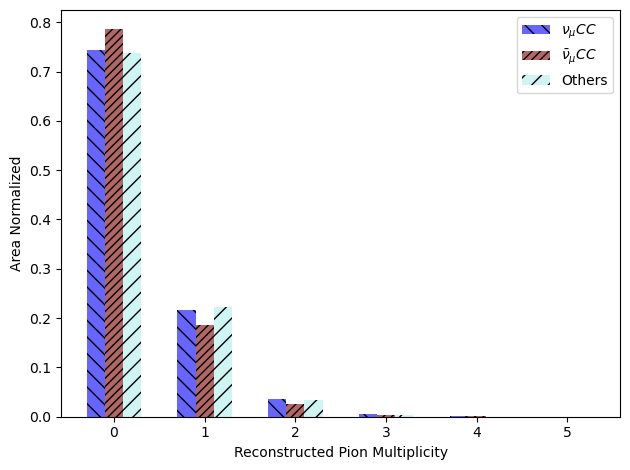

In [63]:
plot_discrete_multiplicity(df_numucc, df_numubar, df_others,
                           column="Num_Pion",
                           xlabel="Reconstructed Pion Multiplicity",
                           max_val=6)

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_78762/1149961834.py:1: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numucc['truth_cos_theta'], 25, (-1,1), density=True, label=r'$\nu_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_78762/1149961834.py:2: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numubar['truth_cos_theta'], 25, (-1,1), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='maroon',hatch='////')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_78762/1149961834.py:3: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the param

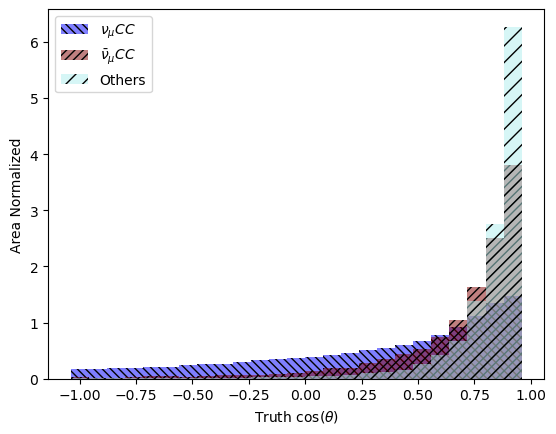

In [64]:
plt.hist(df_numucc['truth_cos_theta'], 25, (-1,1), density=True, label=r'$\nu_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
plt.hist(df_numubar['truth_cos_theta'], 25, (-1,1), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='maroon',hatch='////')
plt.hist(df_others['truth_cos_theta'], 25, (-1,1), density=True, label= r'Others', align='left', alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel(r"Truth cos($\theta$)")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_78762/3470418256.py:1: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numucc['cos_theta'], 25, (-1,1), density=True, label=r'$\nu_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_78762/3470418256.py:2: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numubar['cos_theta'], 25, (-1,1), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='maroon',hatch='////')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_78762/3470418256.py:3: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will be

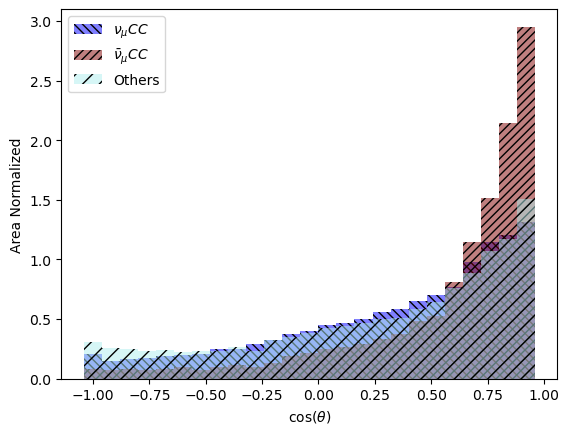

In [65]:
plt.hist(df_numucc['cos_theta'], 25, (-1,1), density=True, label=r'$\nu_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
plt.hist(df_numubar['cos_theta'], 25, (-1,1), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='maroon',hatch='////')
plt.hist(df_others['cos_theta'], 25, (-1,1), density=True, label= r'Others', align='left', alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel(r"cos($\theta$)")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

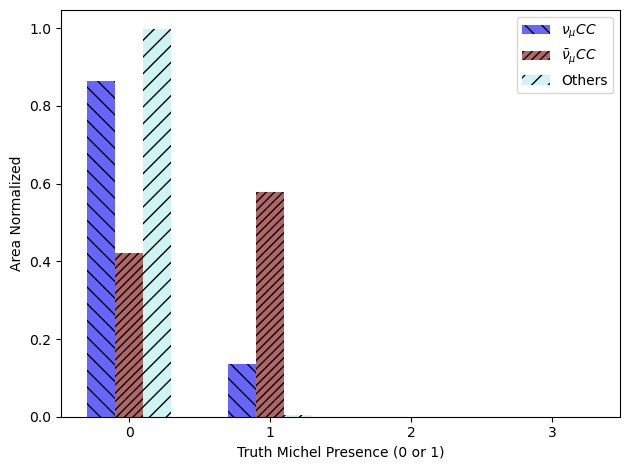

In [66]:
plot_discrete_multiplicity(df_numucc, df_numubar, df_others,
                           column="has_truth_michel",
                           xlabel="Truth Michel Presence (0 or 1)",
                           max_val=4)

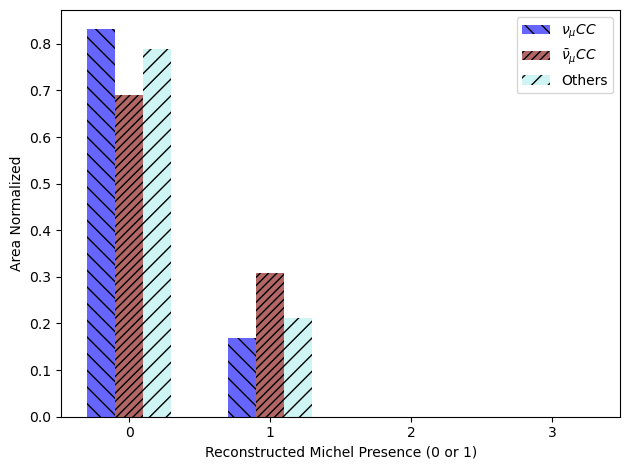

In [67]:
plot_discrete_multiplicity(df_numucc, df_numubar, df_others,
                           column="has_reco_michel",
                           xlabel="Reconstructed Michel Presence (0 or 1)",
                           max_val=4)

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_78762/1326600581.py:1: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numucc['Truth_Proton_Tmax'], 25, (0.,2000.), density=True, label=r'$\nu_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_78762/1326600581.py:2: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numubar['Truth_Proton_Tmax'], 25, (0.,2000.), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='maroon',hatch='////')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_78762/1326600581.py:3: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.

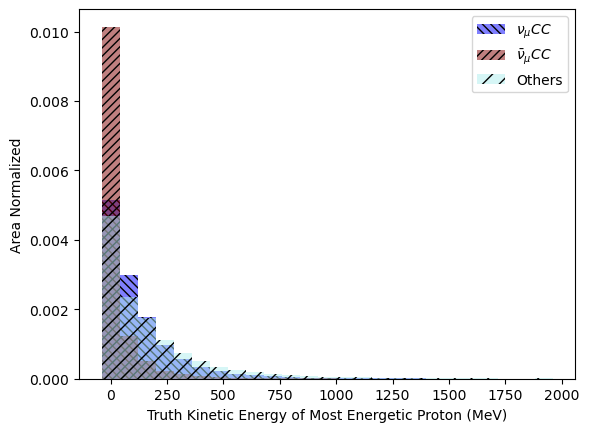

In [68]:
plt.hist(df_numucc['Truth_Proton_Tmax'], 25, (0.,2000.), density=True, label=r'$\nu_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
plt.hist(df_numubar['Truth_Proton_Tmax'], 25, (0.,2000.), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='maroon',hatch='////')
plt.hist(df_others['Truth_Proton_Tmax'], 25, (0.,2000.), density=True, label= r'Others', align='left', alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Truth Kinetic Energy of Most Energetic Proton (MeV)")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_78762/3424916768.py:1: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numucc['Truth_Proton_Tsum'], 25, (0.,2000.), density=True, label=r'$\nu_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_78762/3424916768.py:2: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numubar['Truth_Proton_Tsum'], 25, (0.,2000.), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='maroon',hatch='////')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_78762/3424916768.py:3: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.

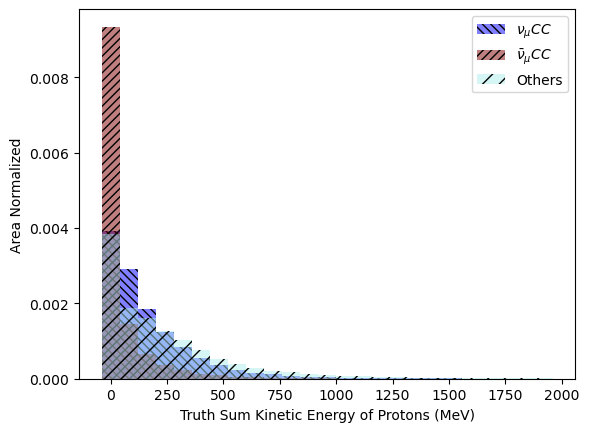

In [69]:
plt.hist(df_numucc['Truth_Proton_Tsum'], 25, (0.,2000.), density=True, label=r'$\nu_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
plt.hist(df_numubar['Truth_Proton_Tsum'], 25, (0.,2000.), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='maroon',hatch='////')
plt.hist(df_others['Truth_Proton_Tsum'], 25, (0.,2000.), density=True, label= r'Others', align='left', alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Truth Sum Kinetic Energy of Protons (MeV)")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

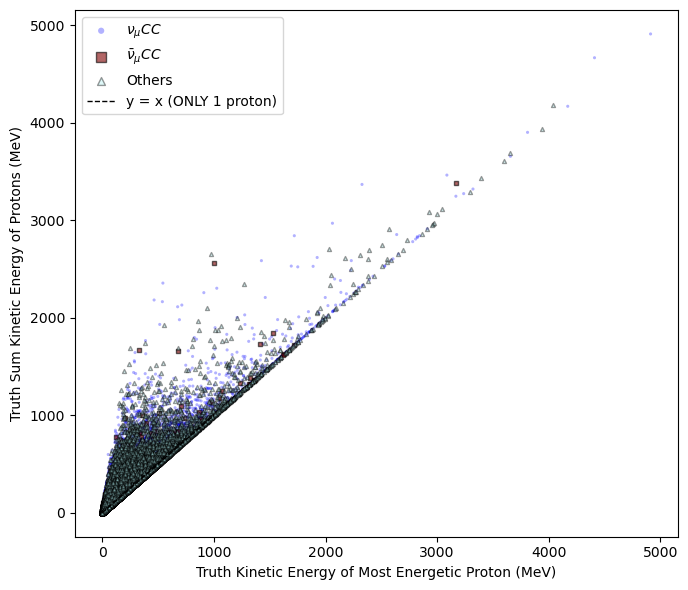

In [70]:
plt.figure(figsize=(7,6))

plt.scatter(df_numucc['Truth_Proton_Tmax'], df_numucc['Truth_Proton_Tsum'],
            label=r'$\nu_{\mu}CC$', alpha=0.3, color='blue', marker='o', s=5, edgecolors='none')

plt.scatter(df_numubar['Truth_Proton_Tmax'], df_numubar['Truth_Proton_Tsum'],
            label=r'$\bar{\nu}_{\mu}CC$', alpha=0.6, color='maroon', marker='s', s=12, edgecolors='k')

plt.scatter(df_others['Truth_Proton_Tmax'], df_others['Truth_Proton_Tsum'],
            label='Others', alpha=0.4, color='paleturquoise', marker='^', s=8, edgecolors='k')

# Add y=x line for reference (single proton events)
plt.plot([0,1000], [0,1000], 'k--', lw=1, label='y = x (ONLY 1 proton)')

# Zoom into 0–1000 MeV region
# plt.xlim(0, 1000)
# plt.ylim(0, 1000)

plt.xlabel("Truth Kinetic Energy of Most Energetic Proton (MeV)")
plt.ylabel("Truth Sum Kinetic Energy of Protons (MeV)")
plt.legend(markerscale=2)
plt.tight_layout()
plt.show()


/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_78762/578185803.py:1: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numucc['muon_energy']*1000, 25, (0.,2000.), density=True, label=r'$\nu_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_78762/578185803.py:2: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(df_numubar['muon_energy']*1000, 25, (0.,2000.), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='maroon',hatch='////')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_78762/578185803.py:3: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; th

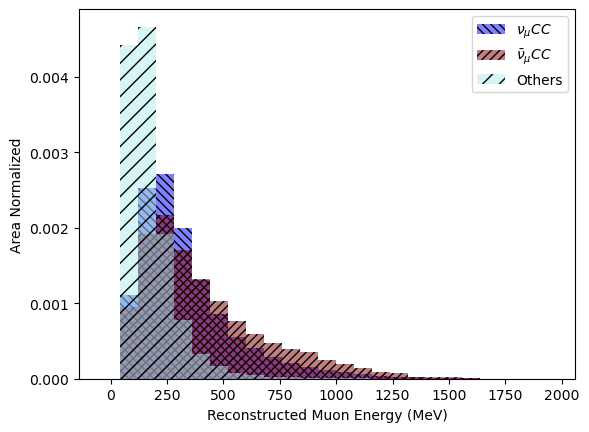

In [71]:
plt.hist(df_numucc['muon_energy']*1000, 25, (0.,2000.), density=True, label=r'$\nu_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
plt.hist(df_numubar['muon_energy']*1000, 25, (0.,2000.), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='maroon',hatch='////')
plt.hist(df_others['muon_energy']*1000, 25, (0.,2000.), density=True, label= r'Others', align='left', alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Muon Energy (MeV)")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

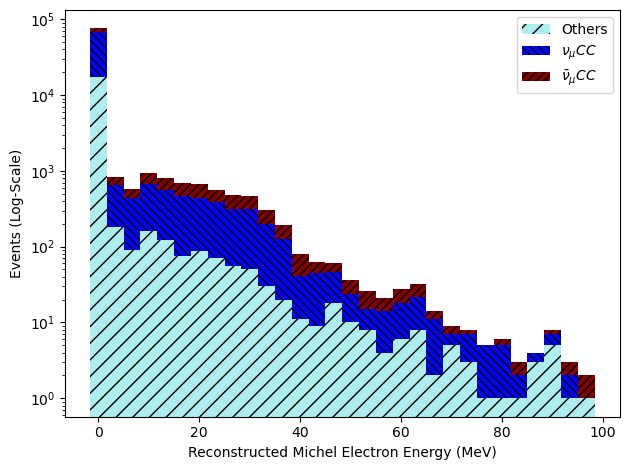

In [72]:
# Prepare the data in the same binning (converted to MeV)
data = [
    df_others['reco_michel_energy'] * 1000,
    df_numucc['reco_michel_energy'] * 1000,
    df_numubar['reco_michel_energy'] * 1000
]

# Define colors, labels, and hatches
colors = ['paleturquoise', 'blue', 'maroon']
labels = ['Others', r'$\nu_{\mu}CC$', r'$\bar{\nu}_{\mu}CC$']
hatches = ['//', '\\\\\\\\', '////']

# Plot stacked histogram
n, bins, patches = plt.hist(
    data,
    bins=30,
    range=(0., 100.),
    stacked=True,
    density=False,
    color=colors,
    label=labels,
    align='left',
    log=True
)

# Apply hatching
for patch_set, hatch in zip(patches, hatches):
    for bar in patch_set:
        bar.set_hatch(hatch)

plt.xlabel("Reconstructed Michel Electron Energy (MeV)")
plt.ylabel("Events (Log-Scale)")
plt.legend()
plt.tight_layout()
plt.show()


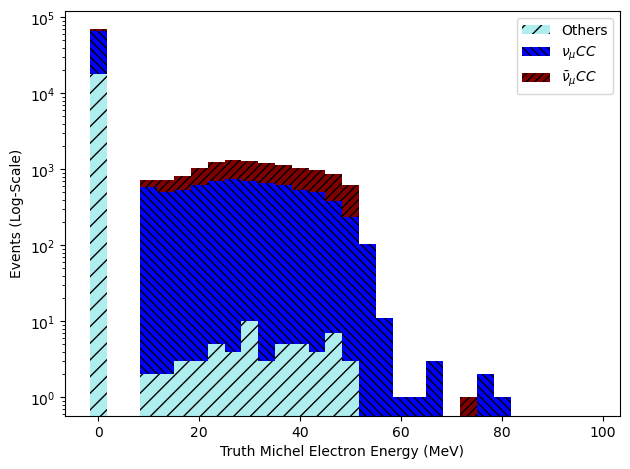

In [73]:
# Prepare the data in the same binning (converted to MeV)
data = [
    df_others['truth_michel_energy'] * 1000,
    df_numucc['truth_michel_energy'] * 1000,
    df_numubar['truth_michel_energy'] * 1000
]

# Define colors, labels, and hatches
colors = ['paleturquoise', 'blue', 'maroon']
labels = ['Others', r'$\nu_{\mu}CC$', r'$\bar{\nu}_{\mu}CC$']
hatches = ['//', '\\\\\\\\', '////']

# Plot stacked histogram
n, bins, patches = plt.hist(
    data,
    bins=30,
    range=(0., 100.),
    stacked=True,
    density=False,
    color=colors,
    label=labels,
    align='left',
    log=True
)

# Apply hatching
for patch_set, hatch in zip(patches, hatches):
    for bar in patch_set:
        bar.set_hatch(hatch)

plt.xlabel("Truth Michel Electron Energy (MeV)")
plt.ylabel("Events (Log-Scale)")
plt.legend()
plt.tight_layout()
plt.show()


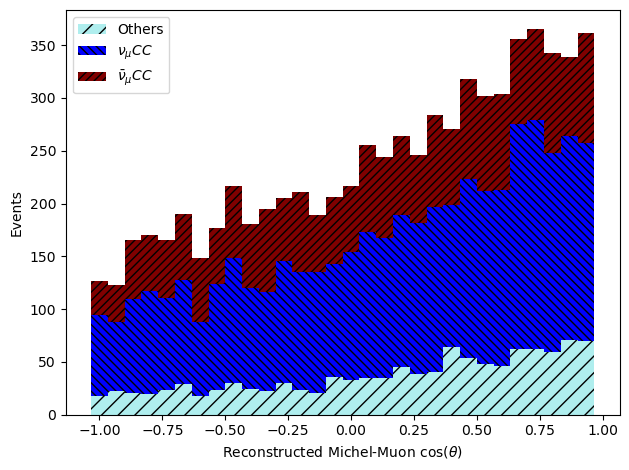

In [74]:
# Prepare the data in the same binning (converted to MeV)
data = [
    df_others['reco_michel_muon_costheta'],
    df_numucc['reco_michel_muon_costheta'],
    df_numubar['reco_michel_muon_costheta']
]

# Define colors, labels, and hatches
colors = ['paleturquoise', 'blue', 'maroon']
labels = ['Others', r'$\nu_{\mu}CC$', r'$\bar{\nu}_{\mu}CC$']
hatches = ['//', '\\\\\\\\', '////']

# Plot stacked histogram
n, bins, patches = plt.hist(
    data,
    bins=30,
    range=(-1., 1.),
    stacked=True,
    density=False,
    color=colors,
    label=labels,
    align='left',
    log=False
)

# Apply hatching
for patch_set, hatch in zip(patches, hatches):
    for bar in patch_set:
        bar.set_hatch(hatch)

plt.xlabel(r"Reconstructed Michel-Muon cos($\theta$)")
plt.ylabel("Events")
plt.legend()
plt.tight_layout()
plt.show()


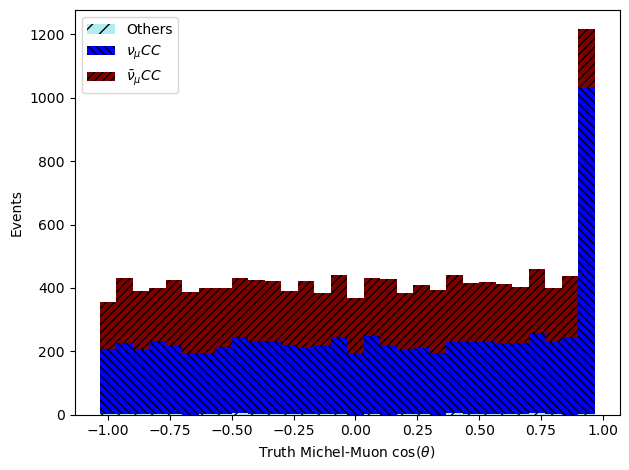

In [75]:
# Prepare the data in the same binning (converted to MeV)
data = [
    df_others['truth_michel_muon_costheta'],
    df_numucc['truth_michel_muon_costheta'],
    df_numubar['truth_michel_muon_costheta']
]

# Define colors, labels, and hatches
colors = ['paleturquoise', 'blue', 'maroon']
labels = ['Others', r'$\nu_{\mu}CC$', r'$\bar{\nu}_{\mu}CC$']
hatches = ['//', '\\\\\\\\', '////']

# Plot stacked histogram
n, bins, patches = plt.hist(
    data,
    bins=30,
    range=(-1., 1.),
    stacked=True,
    density=False,
    color=colors,
    label=labels,
    align='left',
    log=False
)

# Apply hatching
for patch_set, hatch in zip(patches, hatches):
    for bar in patch_set:
        bar.set_hatch(hatch)

plt.xlabel(r"Truth Michel-Muon cos($\theta$)")
plt.ylabel("Events")
plt.legend()
plt.tight_layout()
plt.show()


In [76]:
fig = px.density_heatmap(df_numucc, x="truth_michel_muon_costheta", y="truth_michel_energy", text_auto=False,
                         labels={"truth_michel_energy": "...", "truth_michel_muon_costheta": "cos (theta)"},
                         marginal_x="histogram", marginal_y="histogram", title="numuCC proton multiplicity vs scattering angle",
                         range_x=(-1.,1.), range_y=(0,0.1), nbinsx=100, nbinsy=100)
fig.show()

## Plotting Proton Multiplicity and Scattering Angle Distribution

For numuCC label

In [77]:
fig = px.density_heatmap(df_numucc, x="cos_theta", y="Num_Proton", text_auto=False,
                         labels={"Num_Proton": "Proton Multiplicity", "cos_theta": "cos (theta)"},
                         marginal_x="histogram", marginal_y="histogram", title="numuCC proton multiplicity vs scattering angle",
                         range_x=(0.2,1.02), range_y=(-.2,3.), nbinsx=100, nbinsy=15)
fig.show()

In [78]:
fig = px.density_heatmap(df_numubar, x="cos_theta", y="Num_Proton", text_auto=False, 
                         labels={"Num_Proton": "Proton Multiplicity", "cos_theta": "cos(theta)"},
                         marginal_x="histogram", marginal_y="histogram", title="numubarCC proton multiplicity vs scattering angle",
                         range_x=(0.4,1.02), range_y=(-0.5,3.), nbinsx=75, nbinsy=10)
fig.show()

### **Applying the MC-trained BDT onto other samples (specifically data)**

In [79]:
# # # use our model prediction on all the other samples
# # df_mc4.loc[:,'bdt_score'] = clf.predict_proba(df_mc4[training_variables])[:,1]
# # df_ext.loc[:,'bdt_score'] = clf.predict_proba(df_ext[training_variables])[:,1]
# # df_dirt.loc[:,'bdt_score'] = clf.predict_proba(df_dirt[training_variables])[:,1]
# # df_beam_on.loc[:,'bdt_score'] = clf.predict_proba(df_beam_on[training_variables])[:,1]

# # use our model prediction on all the other samples (custom score: -P0 + P2)
# df_mc.loc[:,'bdt_score'] = -3*clf.predict_proba(df_mc[training_variables])[:,0] - clf.predict_proba(df_mc[training_variables])[:,1] + clf.predict_proba(df_mc[training_variables])[:,2]
# df_ext.loc[:,'bdt_score'] = -3*clf.predict_proba(df_ext[training_variables])[:,0] - clf.predict_proba(df_ext[training_variables])[:,1] + clf.predict_proba(df_ext[training_variables])[:,2]
# df_dirt.loc[:,'bdt_score'] = -3*clf.predict_proba(df_dirt[training_variables])[:,0] - clf.predict_proba(df_dirt[training_variables])[:,1] + clf.predict_proba(df_dirt[training_variables])[:,2]
# df_beam_on.loc[:,'bdt_score'] = -3*clf.predict_proba(df_beam_on[training_variables])[:,0] - clf.predict_proba(df_beam_on[training_variables])[:,1] + clf.predict_proba(df_beam_on[training_variables])[:,2]


In [80]:
# mc_data_stacked_hist(df_beam_on, df_ext, df_mc4, df_dirt, 'bdt_score', 'weight_ubtune', \
#                         "plots/%s_bdt_score" % "bdtScore", r"BDT Score",\
#                         -3., 1., 30, pot_data=run3b_pot_beam_on)

### **For our BDT model, plot out the efficiency and purity of our signal**

In [81]:
from scipy.interpolate import interp1d
from scipy.optimize import fsolve

In [82]:
# Get predicted probabilities for each class
probs_mc = clf.predict_proba(df_mc[training_variables])

# Create new columns for each class-specific BDT score
df_mc['bdt_score_others']  = probs_mc[:, 0]  # class 0 → others
df_mc['bdt_score_numu']    = probs_mc[:, 1]  # class 1 → νμCC
df_mc['bdt_score_numubar'] = probs_mc[:, 2]  # class 2 → ν̅μCC


In [83]:
from scipy.interpolate import interp1d
from scipy.optimize import fsolve
import matplotlib.pyplot as plt
import numpy as np

def plot_eff_purity(df_mc, sig_label):
    step = 0.01
    bdt_var_min = 0.0
    # Set maximum BDT score based on signal label
    if sig_label == "numubar":
        bdt_var_max = 0.96
    elif sig_label == "numu":
        bdt_var_max = 0.965
    elif sig_label == "others":
        bdt_var_max = 0.93
    else:
        raise ValueError("Invalid signal label. Choose from: 'numubar', 'numu', 'others'.")


    # Select appropriate BDT score column
    if sig_label == "numubar":
        score = df_mc['bdt_score_numubar']
        signal_mask = (df_mc.truth_nuPdg == -14) & (df_mc.truth_isCC == 1) & (df_mc.truth_vtxInside == 1)
    elif sig_label == "numu":
        score = df_mc['bdt_score_numu']
        signal_mask = (df_mc.truth_nuPdg == 14) & (df_mc.truth_isCC == 1) & (df_mc.truth_vtxInside == 1)
    elif sig_label == "others":
        score = df_mc['bdt_score_others']
        signal_mask = (df_mc.truth_nuPdg != 14) & (df_mc.truth_nuPdg != -14) & (df_mc.truth_isCC == 1) & (df_mc.truth_vtxInside == 1)
    else:
        raise ValueError("sig_label must be 'numubar', 'numu', or 'others'")

    h_eff, h_eff_x = [], []
    h_pur, h_pur_x = [], []
    h_multi, h_multi_x = [], []

    thresholds = np.arange(bdt_var_min, bdt_var_max + step, step)
    for var in thresholds:
        # Efficiency
        df_eff_num = df_mc[signal_mask & (score > var)]
        df_eff_den = df_mc[signal_mask]
        if len(df_eff_den) != 0:
            eff = len(df_eff_num) / len(df_eff_den)
            h_eff.append(eff)
            h_eff_x.append(var)

        # Purity
        df_pur_den = df_mc[score > var]
        df_pur_num = df_eff_num  # already defined above
        if len(df_pur_den) != 0:
            pur = len(df_pur_num) / len(df_pur_den)
            h_pur.append(pur)
            h_pur_x.append(var)

            # Eff × Pur
            h_multi.append(pur * eff)
            h_multi_x.append(var)

    # Interpolate for intersection
    # f1 = interp1d(h_eff_x, h_eff, kind='linear', fill_value='extrapolate')
    # f2 = interp1d(h_pur_x, h_pur, kind='linear', fill_value='extrapolate')
    # def intersection(x): return f1(x) - f2(x)
    # guess = np.linspace(bdt_var_min, bdt_var_max, 10)
    # roots = fsolve(intersection, guess)
    # valid_roots = [r for r in roots if bdt_var_min <= r <= bdt_var_max]

    # Plotting
    plt.plot(h_eff_x, h_eff, c="green", label="Efficiency")
    plt.plot(h_pur_x, h_pur, c="purple", label="Purity")
    plt.plot(h_multi_x, h_multi, ls="-.", c="red", label=r"Eff. $\times$ Pur.")

    # if valid_roots:
    #     plt.axvline(valid_roots[0], color='blue', ls='--', label=f"Intersection at {valid_roots[0]:.3f}")

    plt.xlim([0, 1.0])  # Keep axis fixed to 1.0 even if data stops early
    plt.ylim([0, 1.1])
    titles = {
        "numubar": r"BDT Model $\bar{\nu}_{\mu}$",
        "numu":    r"BDT Model $\nu_{\mu}$",
        "others":  "BDT Model Background"
    }
    plt.title(f"{titles[sig_label]} Selection Efficiency & Purity")
    plt.xlabel("BDT Score")
    plt.ylabel("Fraction")
    plt.legend()
    plt.tight_layout()
    plt.show()


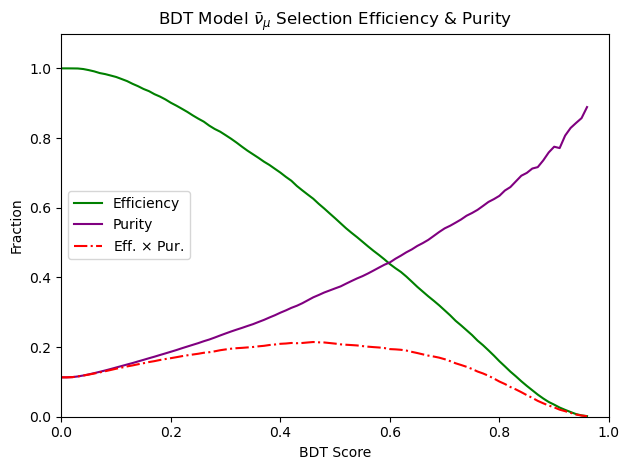

In [84]:
plot_eff_purity(df_mc, "numubar")

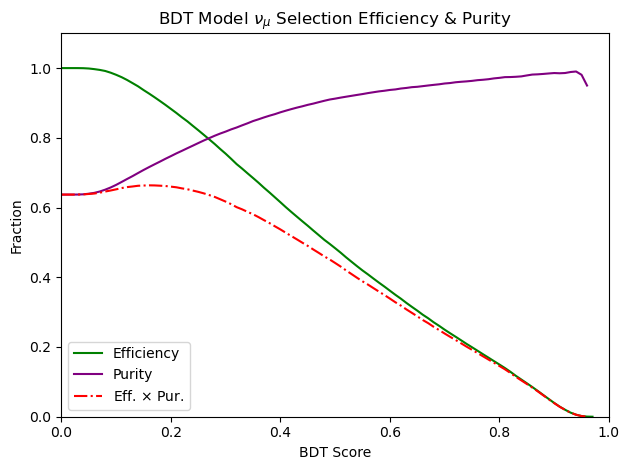

In [85]:
plot_eff_purity(df_mc, "numu")

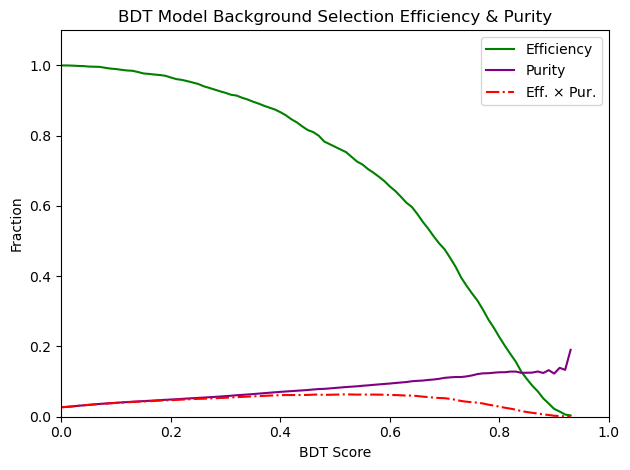

In [86]:
plot_eff_purity(df_mc, "others")

# TEMPLATE FIT


Best-fit scale factors (self-fit should be ~1):
  S_bkg = 1.0000 ± 0.0320
  S_numu = 1.0000 ± 0.0171
  S_numub = 1.0000 ± 0.0591
chi2/ndf = 0.00 / 31 = 0.00


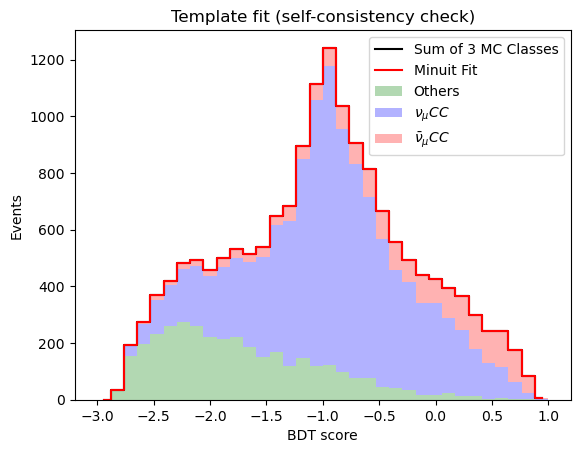

In [87]:
# --- binning must match your plot ---
bins = np.linspace(-3, 1, 35)         # (-3 → others, -1 → numuCC, +1 → numubarCC)
bin_centers = 0.5*(bins[1:]+bins[:-1])

# Optional weights (use your test weights if you have them; else ones)
# try:
#     w = sample_weights_test
# except NameError:
#     w = np.ones_like(score)

wtest = np.ones_like(score)

# --- templates per class in score space ---
mask_bkg   = (targets_test == 0)
mask_numu  = (targets_test == 1)
mask_numub = (targets_test == 2)

hist_bkg,   _ = np.histogram(score[mask_bkg],   bins=bins, weights=wtest[mask_bkg])
hist_numu,  _ = np.histogram(score[mask_numu],  bins=bins, weights=wtest[mask_numu])
hist_numub, _ = np.histogram(score[mask_numub], bins=bins, weights=wtest[mask_numub])

# --- “data” for a self-check is just the sum of templates ---
data_hist = hist_bkg + hist_numu + hist_numub

# --- χ² to minimize (Poisson variance on data bins) ---
def chi2(S_bkg, S_numu, S_numub):
    model = S_bkg*hist_bkg + S_numu*hist_numu + S_numub*hist_numub
    err = np.sqrt(np.maximum(data_hist, 1.0))  # avoid zeros
    return np.sum(((data_hist - model)/err)**2)

m = Minuit(chi2, S_bkg=1.0, S_numu=1.0, S_numub=1.0)
m.limits = [(0, None), (0, None), (0, None)]
m.errordef = Minuit.LEAST_SQUARES
m.migrad(); m.hesse()

print("Best-fit scale factors (self-fit should be ~1):")
for p in ("S_bkg","S_numu","S_numub"):
    print(f"  {p} = {m.values[p]:.4f} ± {m.errors[p]:.4f}")
ndf = len(data_hist) - len(m.values)
print(f"chi2/ndf = {m.fval:.2f} / {ndf} = {m.fval/ndf:.2f}")

# --- compare fit to “data” ---
best = (m.values["S_bkg"]*hist_bkg +
        m.values["S_numu"]*hist_numu +
        m.values["S_numub"]*hist_numub)

plt.step(bin_centers, data_hist, where="mid", color="k", label="Sum of 3 MC Classes")
plt.step(bin_centers, best,      where="mid", color="r", label="Minuit Fit")

# also show the MC components (stacked)
plt.bar(bin_centers, hist_bkg,   width=np.diff(bins), color="green", alpha=0.3, label="Others", align="center")
plt.bar(bin_centers, hist_numu,  width=np.diff(bins), bottom=hist_bkg, 
        color="blue", alpha=0.3, label=r'$\nu_{\mu}CC$', align="center")
plt.bar(bin_centers, hist_numub, width=np.diff(bins), bottom=hist_bkg+hist_numu, 
        color="red", alpha=0.3, label=r'$\bar{\nu}_{\mu}CC$', align="center")

plt.xlabel("BDT score")
plt.ylabel("Events")
plt.title("Template fit (self-consistency check)")
plt.legend()
plt.show()

### FIRST FAKE DATA: UTILIZING "WEIGHT_NO_UBTUNE" AS FAKE BEAM-ON DATA

True scale factors:
  S_bkg^true   = 1.0000
  S_numu^true  = 1.0000
  S_numub^true = 1.0000

Fitted scale factors:
  S_bkg = 1.0018 ± 0.0322  (pull: +0.05σ)
  S_numu = 1.0019 ± 0.0172  (pull: +0.11σ)
  S_numub = 0.9491 ± 0.0591  (pull: -0.86σ)

chi2/ndf = 22.68 / 32 = 0.71


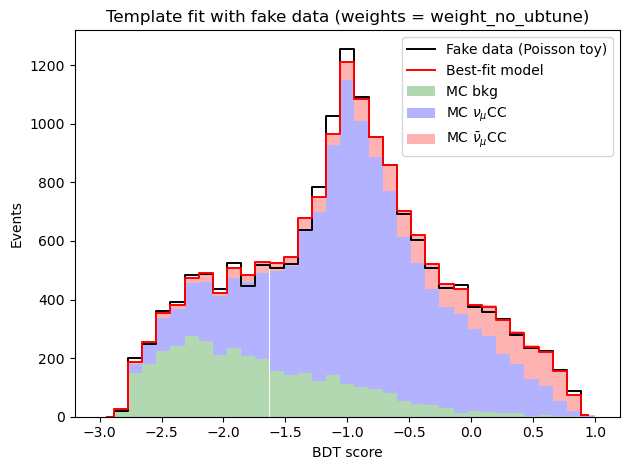

In [89]:
# ----------------------------
# 0) Inputs from earlier cells
# ----------------------------
# score = -3*P0 - P1 + P2
# masks: targets_test == 0 (bkg), 1 (numu), 2 (numubar)
mask_bkg   = (targets_test == 0)
mask_numu  = (targets_test == 1)
mask_numub = (targets_test == 2)

# Use *physics* weights for MC templates (your request):
# If your arrays live in a combined df, replace below accordingly.
# Here I assume you have per-event weights aligned with `score` & `targets_test`.
try:
    w = weight_no_ubtune
except NameError:
    # fallback: unit weights if not present
    w = np.ones_like(score)

# ----------------------------
# 1) Common binning (match your plots!)
# ----------------------------
bins = np.linspace(-3.0, 1.0, 36)  # 35 bins across [-3,1]
bin_centers = 0.5*(bins[1:] + bins[:-1])
bin_widths  = np.diff(bins)

# ----------------------------
# 2) Build MC templates in COUNTS
# ----------------------------
hist_bkg,   _ = np.histogram(score[mask_bkg],   bins=bins, weights=w[mask_bkg])
hist_numu,  _ = np.histogram(score[mask_numu],  bins=bins, weights=w[mask_numu])
hist_numub, _ = np.histogram(score[mask_numub], bins=bins, weights=w[mask_numub])

# ----------------------------
# 3) Make fake "beam-on" data
#    Choose some true scaling factors and Poisson fluctuate.
# ----------------------------
S_true_bkg, S_true_numu, S_true_numub = 1., 1., 1.  # <- pick any truths you want

mu = (S_true_bkg * hist_bkg +
      S_true_numu * hist_numu +
      S_true_numub * hist_numub)

rng = np.random.default_rng(12345)
data_hist = rng.poisson(lam=np.maximum(mu, 0.0))  # Poisson toy

# ----------------------------
# 4) Chi^2 fit with iminuit
# ----------------------------
def chi2(S_bkg, S_numu, S_numub):
    model = S_bkg*hist_bkg + S_numu*hist_numu + S_numub*hist_numub
    # Poisson variance from *data* counts:
    err = np.sqrt(np.maximum(data_hist, 1.0))
    return np.sum(((data_hist - model)/err)**2)

m = Minuit(chi2, S_bkg=1.0, S_numu=1.0, S_numub=1.0)
m.limits = [(0, None), (0, None), (0, None)]
m.errordef = Minuit.LEAST_SQUARES
m.migrad(); m.hesse()

best = (m.values["S_bkg"]*hist_bkg +
        m.values["S_numu"]*hist_numu +
        m.values["S_numub"]*hist_numub)

ndf = len(data_hist) - 3

print("True scale factors:")
print(f"  S_bkg^true   = {S_true_bkg:.4f}")
print(f"  S_numu^true  = {S_true_numu:.4f}")
print(f"  S_numub^true = {S_true_numub:.4f}\n")

print("Fitted scale factors:")
for p in ("S_bkg","S_numu","S_numub"):
    val, err = m.values[p], m.errors[p]
    print(f"  {p} = {val:.4f} ± {err:.4f}  (pull: {(val - {'S_bkg':S_true_bkg,'S_numu':S_true_numu,'S_numub':S_true_numub}[p])/err:+.2f}σ)")
print(f"\nchi2/ndf = {m.fval:.2f} / {ndf} = {m.fval/ndf:.2f}")

# ----------------------------
# 5) Plot: fake data + best-fit model + stacked MC templates
# ----------------------------
plt.bar(bin_centers, hist_bkg,   width=bin_widths, color="green", alpha=0.30, label="MC bkg", align="center", edgecolor="none")
plt.bar(bin_centers, hist_numu,  width=bin_widths, bottom=hist_bkg,
        color="blue",  alpha=0.30, label=r"MC $\nu_\mu$CC", align="center", edgecolor="none")
plt.bar(bin_centers, hist_numub, width=bin_widths, bottom=hist_bkg+hist_numu,
        color="red",   alpha=0.30, label=r"MC $\bar{\nu}_\mu$CC", align="center", edgecolor="none")

plt.step(bin_centers, data_hist, where="mid", color="k", linewidth=1.4, label="Fake data (Poisson toy)")
plt.step(bin_centers, best,      where="mid", color="r", linewidth=1.4, label="Best-fit model")

plt.xlabel("BDT score")
plt.ylabel("Events")
plt.title("Template fit with fake data (weights = weight_no_ubtune)")
plt.legend()
plt.tight_layout()
plt.show()
